<a href="https://colab.research.google.com/github/mingliangwsu/RHESSys_PreProcess_GenerateTiff/blob/main/RHESSys_Prepare_SpatialDataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#This is the code for prepare the spatial data set for running RHESSys model

##Prepare GEE engine

In [ ]:
import ee
ee.Authenticate()
ee.Initialize()

To authorize access needed by Earth Engine, open the following URL in a web browser and follow the instructions. If the web browser does not start automatically, please manually browse the URL below.

    https://code.earthengine.google.com/client-auth?scopes=https%3A//www.googleapis.com/auth/earthengine%20https%3A//www.googleapis.com/auth/devstorage.full_control&request_id=ULpBoTF38uGDv5RLVzFsV3QythZcx-yVxw-kWxd0yW4&tc=pddkrFEpAkK7k_RkghB1qDbaFHkeenfzC9chkW5_twE&cc=wQ-cNHKV0HDFOMLxZbix5Mexl2Wqn7RlFo_mQGNGZzk

The authorization workflow will generate a code, which you should paste in the box below.
Enter verification code: 4/1AVHEtk7jpICRF56SQyKQbg7VgWcce4_oZJw-AfiM-8QjsYfZoaf2pFQC8yI

Successfully saved authorization token.


##Testing GEE API

In [ ]:
# Print the elevation of Mount Everest.
dem30m = ee.Image('USGS/SRTMGL1_003')
xy = ee.Geometry.Point([86.9250, 27.9881])
elev = dem30m.sample(xy, 30).first().get('elevation').getInfo()
print('Mount Everest elevation (m):', elev)

Mount Everest elevation (m): 8729


## Mount google drive


In [ ]:
import os

from google.colab import drive
drive.mount('/content/drive', force_remount=True)

geedata_dir = '/content/drive/MyDrive/RHESSys/SpatialData/Basin/test'
if not os.path.exists(geedata_dir):
    os.makedirs(geedata_dir, exist_ok=True)

#download ndvi data
ndvidata_dir = '/content/drive/MyDrive/RHESSys/GateCreek'
if not os.path.exists(ndvidata_dir):
    os.makedirs(ndvidata_dir, exist_ok=True)

#"True", means user already downloaded the maps, and just testing some specific steps; 
#"False", mean user need run every step to download everything (This shoule be the default).
debug = False

Mounted at /content/drive


##Install and import folium

In [ ]:
#!pip install folium
!pip install folium --upgrade
try:
  import rasterio
except ImportError as e:  
  !pip install rasterio
  import rasterio

!pip show folium
from pickle import FALSE
# Import the Folium library.
import folium
from folium import plugins
from folium.plugins import MeasureControl
from folium.plugins import BeautifyIcon
import json
import pandas as pd

try:
  import geemap
except ImportError as e:
  !pip install geemap
  import geemap
!pip show geemap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Name: folium
Version: 0.14.0
Summary: Make beautiful maps with Leaflet.js & Python
Home-page: https://github.com/python-visualization/folium
Author: Rob Story
Author-email: wrobstory@gmail.com
License: MIT
Location: /usr/local/lib/python3.9/dist-packages
Requires: branca, jinja2, numpy, requests
Required-by: datascience, geemap
Name: geemap
Version: 0.20.4
Summary: A Python package for interactive mapping using Google Earth Engine and ipyleaflet
Home-page: https://github.com/giswqs/geemap
Author: Qiusheng Wu
Author-email: giswqs@gmail.com
License: MIT license
Location: /usr/local/lib/python3.9/dist-packages
Requires: bqplot, colour, earthengine-api, ee-extra, eerepr, ffmpeg-python, folium, gdown, geeadd, geocoder, geojson, ipyevents, ipyfilechooser, ipyleaflet, ipytree, ipywidgets, matplotlib, numpy, pandas, pillow, pycrs, pyperclip, pyshp, python-box, sankee, scooby, whiteboxgui, xyzserv

## Functions for plotting GeoTiff files

In [ ]:
import rasterio
from rasterio.plot import show
import matplotlib.pyplot as plt

def plot_geotiff(geotiff_file,cmap,masked=False):
    # Open the GeoTIFF file using rasterio
    with rasterio.open(geotiff_file) as src:
        # Read the raster data
        data = src.read(1, masked=masked)
        # Get the spatial metadata
        transform = src.transform
        crs = src.crs
    # Create a plot of the raster data
    fig, ax = plt.subplots(figsize=(10, 8))
    show(data, transform=transform, cmap=cmap, ax=ax)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_title(geotiff_file.split('/')[-1])
    plt.show()

################################################################################
#https://stackoverflow.com/questions/14720331/how-to-generate-random-colors-in-matplotlib
def rand_cmap(nlabels, type='bright', first_color_black=True, last_color_black=False, verbose=True):
    """
    Creates a random colormap to be used together with matplotlib. Useful for segmentation tasks
    :param nlabels: Number of labels (size of colormap)
    :param type: 'bright' for strong colors, 'soft' for pastel colors
    :param first_color_black: Option to use first color as black, True or False
    :param last_color_black: Option to use last color as black, True or False
    :param verbose: Prints the number of labels and shows the colormap. True or False
    :return: colormap for matplotlib
    """
    from matplotlib.colors import LinearSegmentedColormap
    import colorsys
    import numpy as np


    if type not in ('bright', 'soft'):
        print ('Please choose "bright" or "soft" for type')
        return

    if verbose:
        print('Number of labels: ' + str(nlabels))

    # Generate color map for bright colors, based on hsv
    if type == 'bright':
        randHSVcolors = [(np.random.uniform(low=0.0, high=1),
                          np.random.uniform(low=0.2, high=1),
                          np.random.uniform(low=0.9, high=1)) for i in range(nlabels)]

        # Convert HSV list to RGB
        randRGBcolors = []
        for HSVcolor in randHSVcolors:
            randRGBcolors.append(colorsys.hsv_to_rgb(HSVcolor[0], HSVcolor[1], HSVcolor[2]))

        if first_color_black:
            randRGBcolors[0] = [0, 0, 0]

        if last_color_black:
            randRGBcolors[-1] = [0, 0, 0]

        random_colormap = LinearSegmentedColormap.from_list('new_map', randRGBcolors, N=nlabels)

    # Generate soft pastel colors, by limiting the RGB spectrum
    if type == 'soft':
        low = 0.6
        high = 0.95
        randRGBcolors = [(np.random.uniform(low=low, high=high),
                          np.random.uniform(low=low, high=high),
                          np.random.uniform(low=low, high=high)) for i in range(nlabels)]

        if first_color_black:
            randRGBcolors[0] = [0, 0, 0]

        if last_color_black:
            randRGBcolors[-1] = [0, 0, 0]
        random_colormap = LinearSegmentedColormap.from_list('new_map', randRGBcolors, N=nlabels)

    # Display colorbar
    if verbose:
        from matplotlib import colors, colorbar
        from matplotlib import pyplot as plt
        fig, ax = plt.subplots(1, 1, figsize=(15, 0.5))

        bounds = np.linspace(0, nlabels, nlabels + 1)
        norm = colors.BoundaryNorm(bounds, nlabels)

        cb = colorbar.ColorbarBase(ax, cmap=random_colormap, norm=norm, spacing='proportional', ticks=None,
                                   boundaries=bounds, format='%1i', orientation=u'horizontal')

    return random_colormap

###Some visual parameter 

In [ ]:
black_poly_params = {
    'color': '000000', 
    'pointSize': 3,
    'pointShape': 'circle',
    'width': 2,
    'lineType': 'solid',
    'fillColor': '00000000',
}
white_poly_params = {
    'color': 'FFFFFF', 
    'pointSize': 5,
    'pointShape': 'circle',
    'width': 5,
    'lineType': 'dotted',
    'fillColor': '00000000',
}
red_poly_params = {
    'color': 'FF0000', 
    'pointSize': 3,
    'pointShape': 'circle',
    'width': 2,
    'lineType': 'solid',
    'fillColor': '00000000',
}
gray_poly_params = {
    'color': '808080', 
    'pointSize': 2,
    'pointShape': 'circle',
    'width': 1,
    'lineType': 'solid',
    'fillColor': '00000000',
}

dem_vis_params = {
    'min': 0,
    'max': 4000,
    'palette': ['#0000ff', '#0040ff', '#0080ff', '#00bfff', '#00ffbf', '#00ff80', '#80ff00', '#bfff00'
    , '#ffff00', '#ffbf00', '#ff8000', '#ff4000', '#ff0000', '#bf0040', '#800080', '#400080', '#0000ff', '#4d4dff', '#9999ff', '#e6e6ff']
}

###Data sets and GAGES II stations

In [ ]:
#Pacific Nowthwest
pnwxmin,pnwymin,pnwxmax,pnwymax = -126.0,41.5,-110.5,49.0
#for display purposes
wwsbnd = ee.Geometry.Rectangle([pnwxmin,pnwymin,pnwxmax,pnwymax], 'EPSG:4326')
wwscenter = ee.Geometry.Point((pnwxmin+pnwxmax)/2.0,(pnwymin+pnwymax)/2.0)
# dem 
dem10m = ee.Image('USGS/3DEP/10m').clip(wwsbnd)
# State boundary
statebnd = ee.FeatureCollection("TIGER/2016/States").filterBounds(wwsbnd)
# county boundary 
countybnd = ee.FeatureCollection(ee.FeatureCollection("TIGER/2016/Counties")).filterBounds(wwsbnd)
# MTBS burnt area
MTBS = ee.FeatureCollection("USFS/GTAC/MTBS/burned_area_boundaries/v1").filterBounds(wwsbnd)
# NLCD 2019
NLCD2019 = ee.ImageCollection("USGS/NLCD_RELEASES/2019_REL/NLCD").filter(ee.Filter.eq('system:index', '2019')).first().select('landcover').clip(wwsbnd)
# Global Surface Water Mapping Layers
surfacew = ee.Image("JRC/GSW1_4/GlobalSurfaceWater").clip(wwsbnd)
# HUC 8
HUC08 = ee.FeatureCollection("USGS/WBD/2017/HUC08").filterBounds(wwsbnd)
# HUC 10
HUC10 = ee.FeatureCollection("USGS/WBD/2017/HUC10").filterBounds(wwsbnd)
# HUC 12
HUC12 = ee.FeatureCollection("USGS/WBD/2017/HUC12").filterBounds(wwsbnd)

#https://www.oregon.gov/deq/wq/programs/pages/dwp-maps.aspx
#Surface water drinking water source areas in Oregon
OR_SW_DWSAs = ee.FeatureCollection("projects/ee-mingliangliuearth/assets/OR_SW_DWSAs_ORLAMBERT_Ver10_15JAN2019")
#WA
WA_SW_DWSAs = ee.FeatureCollection("projects/ee-mingliangliuearth/assets/WA_drinking_Water_source_area")


#EPA reach ER1-2
StreamEr1_2 = ee.FeatureCollection("projects/ee-mingliangliuearth/assets/Erf1_20") #.filterBounds(wwsbnd)

#WA WQ stations from WADOE
WA_WQ = ee.FeatureCollection("projects/ee-mingliangliuearth/assets/WA_WQ_points_WADOE_pro")
#OR WQ stations from ORDEQ
OR_WQ = ee.FeatureCollection("projects/ee-mingliangliuearth/assets/OR_WQ_points_ORDEQ_pro")


if True:
  gagesII = ee.FeatureCollection("projects/ee-mingliangliuearth/assets/gagesII_9322_sept30_2011").filterBounds(wwsbnd)
  # Load the USGS stream gauges observation data
  #my_map.add_ee_layer(gagesII, {'color': 'blue','width': 3}, 'Gages-II')
  ref_gages = gagesII.filter(ee.Filter.eq('CLASS', 'Ref'))
  noref_gages_gt100km = gagesII.filter(ee.Filter.neq('CLASS', 'Ref')).filter(ee.Filter.gt('DRAIN_SQKM', 250))
  noref_gages_lt100km = gagesII.filter(ee.Filter.neq('CLASS', 'Ref')).filter(ee.Filter.lt('DRAIN_SQKM', 250))
  #count = ref_gages.size().getInfo()
  print('Number of Gages Ref:', ref_gages.size().getInfo(), 
        ' NoRef (>250km2):',noref_gages_gt100km.size().getInfo(),
        ' NoRef (<250km2):',noref_gages_lt100km.size().getInfo())


Number of Gages Ref: 303  NoRef (>250km2): 507  NoRef (<250km2): 186


##Selecting study domain and display the maps

In [ ]:
for basemap in geemap.basemaps:
    print(basemap)

In [ ]:
import urllib.request
import time
wgs84 = ee.Projection('EPSG:4326')

use_folium = False

if use_folium:
  map = folium.Map(location=[(pnwymin+pnwymax)/2.0,(pnwxmin+pnwxmax)/2.0],width=800,height=600, zoom_start=11,control_scale=True)
  #map.add_ee_layer(elevation, dem_vis_params, 'Elevation')

else:
  Map = geemap.Map(center=((pnwymin+pnwymax)/2.0, (pnwxmin+pnwxmax)/2.0), zoom=6)
  Map.add_basemap('HYBRID')
  Map.add_basemap('TERRAIN')
  Map.add_basemap('NLCD 2019 CONUS Land Cover')
  Map.addLayer(statebnd.style(**white_poly_params), {}, 'US States')

  Map.addLayer(HUC12.style(**gray_poly_params), {}, 'HUC12')
  Map.addLayer(HUC10.style(**black_poly_params), {}, 'HUC10')

  Map.addLayer(ref_gages, {'color': 'blue','pointSize': 10,'width': 15}, "GAGESII ref")
  Map.addLayer(noref_gages_gt100km, {'color': 'black','pointSize': 10,'width': 5}, "GAGESII nonref>250km2")
  Map.addLayer(noref_gages_lt100km, {'color': 'gray','pointSize': 10,'width': 1}, "GAGESII nonref<250km2")


inputbnd = "typein"
if inputbnd == "image":
  #Boundary image
  bndryimg = ee.Image('projects/ee-mingliangliuearth/assets/BT_canopy_cover')
  userprojection = bndryimg.projection()
  target_resolution = userprojection.nominalScale().getInfo()
  geometry = bndryimg.geometry().buffer(5000)
elif inputbnd == "draw":
  image = ee.Image('USGS/SRTMGL1_003')
  # Set visualization parameters.
  vis_params = {
    'min': 0,
    'max': 4000,
    'palette': ['006633', 'E5FFCC', '662A00', 'D8D8D8', 'F5F5F5'],
  }
  # Add Earth Engine DEM to map

  if use_folium:
    draw = plugins.Draw(export=True,filename='drawing.geojson',show_geometry_on_click=True,position="topleft")
    basemaps["Google Terrain"].add_to(map)
    draw.add_to(map)
    map.add_child(draw)

    # add the measure plugin to the map and enable the measure distance and area options
    measure = MeasureControl(control=False, position='topleft', primary_length_unit='meters',
                    secondary_length_unit=None, primary_area_unit='sqmeters',
                    secondary_area_unit=None).add_to(map)
    #features = draw.last_action


    map.add_child(folium.LayerControl())
    plugins.Fullscreen().add_to(map)
    display(map)

  else:
    # Wait for the user to finish drawing a feature
    print(f'Wait user to draw study domain...\n')
    #Map.draw_features
    display(Map)
  

elif inputbnd == "typein":
  xmin = -122.63
  ymin = 44.11
  xmax = -122.33
  ymax = 44.27
  #The buffer is making sure gridMet data cover entire region
  geometry = ee.Geometry.Rectangle([xmin,ymin,xmax,ymax], 'EPSG:4326').buffer(0.1)
  if not use_folium:
    Map.centerObject(geometry, zoom=11)
    #Show domain
    #elevation = ee.Image('USGS/SRTMGL1_003').select('elevation').clip(geometry)
    #Map.addLayer(elevation,dem_vis_params,"Elevation")
    Map.addLayer(ee.FeatureCollection([geometry]).style(**red_poly_params), {}, 'Input Domain')
    display(Map)  


Map(center=[44.19006193924452, -122.48000000000032], controls=(WidgetControl(options=['position', 'transparent…

In [ ]:
if not debug and inputbnd == "draw":
  if use_folium:
    print("Not implemented yet!")
  else:
    if len(Map.draw_features) == 0:
      print('Error: You need select the domain from the interactive map!\n')

    roi = ee.FeatureCollection(Map.draw_features)
    print(f'Drawed features:{len(Map.draw_features)}   Only last draw is selected!')
    geometry = ee.Feature(roi.toList(roi.size()).get(-1)).geometry().buffer(0.1)
    Map.centerObject(geometry, zoom=10)
    #Show domain
    elevation = ee.Image('USGS/SRTMGL1_003').select('elevation').clip(geometry)
    Map.addLayer(elevation,dem_vis_params,"Elevation")
    Map.addLayer(geometry, {}, 'Input Domain')
    display(Map)


###User need set the projection and spatial resolution for rasters

In [ ]:
if not debug:
  #userprojection = ee.Projection("EPSG:26913")
  userprojection = ee.Projection("EPSG:26910")  #NAD83 / UTM zone 10N
  target_resolution = 30

  print('User Projection:' + str(userprojection.getInfo()))
  #print('Geo Projection:' + str(wgs84.getInfo()))
  print('Spatial resolution:', target_resolution)
  #clip elevation

User Projection:{'type': 'Projection', 'crs': 'EPSG:26910', 'transform': [1, 0, 0, 0, 1, 0]}
Spatial resolution: 30


##Download the DEM for watershed delineation

In [ ]:
if not debug:
  #get elevation
  elevation = ee.Image('USGS/SRTMGL1_003').select('elevation').clip(geometry)
  image_bounds = elevation.geometry().bounds()
  # Extract the five points from the bounds of the rectangle
  lower_left = image_bounds.coordinates().get(0).getInfo()[0]
  lower_right = image_bounds.coordinates().get(0).getInfo()[1]
  upper_right = image_bounds.coordinates().get(0).getInfo()[2]
  upper_left = image_bounds.coordinates().get(0).getInfo()[3]
  lower_left_again = image_bounds.coordinates().get(0).getInfo()[4]
  print('ll:' + str(lower_left) + ' ur:' + str(upper_right))
  #print('ll:' + str(lower_left) + ' ur:' + str(upper_right))
  center = [lower_left[1] + (upper_left[1] - lower_left[1]) / 2, 
            lower_left[0] + (lower_right[0] - lower_left[0]) / 2]
  print('Center [0]y:' + str(center[0]) + ' [1]x:' + str(center[1]))
  #image = ee.Image.loadGeoTIFF(DEM_PATH)
  #print(DEM_PATH)
  # + image.getInfo())

  Map.centerObject(geometry, zoom=11)
  map.add_ee_layer(elevation, dem_vis_params, 'Elevation')
  Map.addLayer(elevation,dem_vis_params,"Elevation")
  display(Map)


ll:[-122.6300012567225, 44.10999910011486] ur:[-122.32999874327753, 44.27009904290325]
Center [0]y:44.19004907150905 [1]x:-122.48000000000002


Map(bottom=190556.0, center=[44.19006193924452, -122.48000000000032], controls=(WidgetControl(options=['positi…

##Select region for processing

## Smothing the elevation and download to google drive

In [ ]:
smothed_dem = 'smothed_gee_elevation.tif'
if not debug:

  #newmap = folium.Map(location=[center[0],center[1]],width=800,height=600, zoom_start=11,control_scale=True)
  reprojected_elevation = elevation.reproject(crs=userprojection.crs(),scale=target_resolution)
  # Smooth the image using a Gaussian filter
  smoothed_dem = reprojected_elevation.reduceNeighborhood(
      reducer=ee.Reducer.mean(),
      kernel=ee.Kernel.gaussian(radius=3, sigma=2),
  )
  #set compression method for WhiteBoxTools
  #smoothed_dem = smoothed_dem.set('compression', 'LZW')

  #export smothed dem to tiff file
  # Get a download URL for the clipped image
  download_url_dem = smoothed_dem.getDownloadURL({
      'name': smothed_dem[:-4], # set a name for the downloaded file
      'scale': 30, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
  })

  # Download the image to your local machine
  urllib.request.urlretrieve(download_url_dem, f'{geedata_dir}/{smothed_dem}')


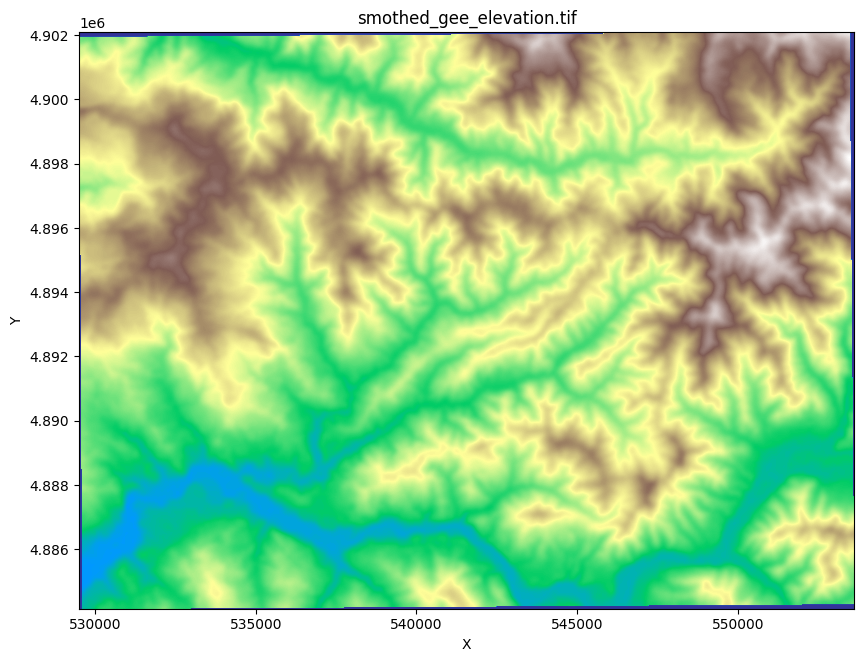

In [ ]:
plot_geotiff(f'{geedata_dir}/{smothed_dem}','terrain')

###Input the outlet and snap to stream network

##Check if typy in outlet or draw at the map

In [ ]:
set_outlet = "draw" # "typein" or "draw"
if set_outlet == "draw":
  print("Mark the outlet point on the map as the outlet...")
  display(Map)

Mark the outlet point on the map as the outlet...


Map(bottom=190556.0, center=[44.19006193924452, -122.48000000000032], controls=(WidgetControl(options=['positi…

In [ ]:
try:
  import pyproj
except ImportError as e:
  !pip install pyproj
  import pyproj

# Delineate a catchment
# ---------------------
# Specify pour point
#lon, lat = -105.5841389, 40.3538611
#drain_area_km2 = 104.7
if set_outlet == "draw":
  if len(Map.draw_features) == 0:
    print('Error: You need select the domain from the interactive map!\n')

  site = ee.FeatureCollection(Map.draw_features)
  print(f'Drawed features:{len(Map.draw_features)}   Only last draw is selected!')
  outletp = ee.Feature(site.toList(site.size()).get(-1)).geometry()
  lat = outletp.coordinates().get(1).getInfo()
  lon = outletp.coordinates().get(0).getInfo()
  print(f'lat:{lat} lon:{lon}')

else:
  lon, lat = -122.572015, 44.145683
  drain_area_km2 = 124.4484
  drain_area_pixels = drain_area_km2 * 1000000 / (target_resolution * target_resolution)


Drawed features:2   Only last draw is selected!
lat:44.1637 lon:-122.539294


###Reproject the outlet and generate shape file

In [ ]:
# Transform the coordinates
src_proj_crs = wgs84.crs().getInfo()
tgt_proj_crs = userprojection.crs().getInfo()

# Create a transformer object that can convert coordinates from input_crs to output_crs
transformer = pyproj.Transformer.from_crs(src_proj_crs, tgt_proj_crs)
#Liu: it's weird but need be carful!!
x, y = transformer.transform(lat,lon)

print(f"Input coordinates (lon-lat): ({lon}, {lat})")
print(f"Output coordinates (UTM): ({x}, {y})")


Input coordinates (lon-lat): (-122.572682, 44.146252)
Output coordinates (UTM): (534175.5814781581, 4888205.700456547)


##Export outlet feature 

In [ ]:
gage_fc_name = 'USGSgage'
gegename = 'GATE CREEK AT VIDA,OREG'

#Generate outlet shapefile
print(f"user projection: {userprojection.crs().getInfo()}")

#use_snapped = False
#if not use_snapped:
  #use raw

if not debug:
  outlet = ee.Geometry.Point([lon, lat], "EPSG:4326").transform(userprojection.crs().getInfo())


  print(f"generated outlet projection:{outlet.projection().crs().getInfo()}")
  # Define a point feature with properties
  point_feature = ee.Feature(
      outlet,  
      {"name": gegename, "id": 1}   # Properties of the point feature
  )

  # Create a feature collection from the point feature
  feature_collection = ee.FeatureCollection([point_feature])

  # Export the FeatureCollection to Google Drive
  task = ee.batch.Export.table.toDrive(
    collection = feature_collection,
    description = gage_fc_name,
    driveFolder = "XXX",  # Folder name in Google Drive
    fileFormat = 'SHP'
    #,         # File format
    #crs = userprojection.crs().getInfo()
  )
  task.start()

  # Wait for the export task to complete
  import time
  while task.active():
    print('Exporting...')
    time.sleep(5)

  # Check for errors
  if task.status()['state'] != 'COMPLETED':
    print('Export failed:', task.status()['error_message'])
  else:
    print('Export completed successfully!')

  time.sleep(10)
  %cp /content/drive/MyDrive/XXX/* "{geedata_dir}" 
  %rm -r /content/drive/MyDrive/XXX

user projection: EPSG:26910
generated outlet projection:EPSG:26910
Exporting...
Exporting...
Exporting...
Exporting...
Exporting...
Export completed successfully!


##Using WhiteBoxTools

###Install WhiteBoxTools from source code

In [ ]:
from re import VERBOSE
try:
  import whitebox
except ImportError as e:
  !pip install whitebox
  import whitebox
!pip show whitebox

os.chdir(geedata_dir)
wbt = whitebox.WhiteboxTools()
wbt.set_working_dir(geedata_dir)
#Normal WBT doesn't work on some functions, so need install WBT from source code
#I have installed from source code in colab and copied the executables to
#/content/drive/MyDrive/RHESSys/WhiteBoxTools_Colab_Compiled_Target_Release_20230324
%cp /content/drive/MyDrive/RHESSys/WhiteBoxTools_Colab_Compiled_Target_Release_20230324/conditional_evaluation /usr/local/lib/python3.9/dist-packages/whitebox/plugins/conditional_evaluation
%cp /content/drive/MyDrive/RHESSys/WhiteBoxTools_Colab_Compiled_Target_Release_20230324/raster_calculator /usr/local/lib/python3.9/dist-packages/whitebox/plugins/raster_calculator


Name: whitebox
Version: 2.3.1
Summary: An advanced geospatial data analysis platform 
Home-page: https://github.com/giswqs/whitebox
Author: Qiusheng Wu
Author-email: giswqs@gmail.com
License: MIT license
Location: /usr/local/lib/python3.9/dist-packages
Requires: Click
Required-by: whiteboxgui


### Convert compressed dem to NONE compressed dem (whiteboxtools seems only handle none compressed GeoTiff)

##WhiteBoxTools does not support compressed tiff. So create a function to convert

###Function to convert GeoTiff to uncompressed format

In [ ]:
def GeoTiffToUncompressedTiff(orig_tiff,nocomp_tiff):
  # Build the gdal_translate command
  cmd = ['gdal_translate', '-co', 'COMPRESS=NONE', orig_tiff, nocomp_tiff]

  # Run the gdal_translate command
  import subprocess
  if not os.path.exists('/usr/bin/gdal_translate'):
      !sudo apt-get install gdal-bin python3-gdal
  try:
      subprocess.check_call(cmd)
      print(f'Successfully converted {orig_tiff} to {nocomp_tiff}')
  except subprocess.CalledProcessError as e:
      print(f'Error: {e}')

########################################################
def GeoTiffIntToFloat(inttiff,floattiff):
  # Build the gdal_translate command
  cmd = ['gdal_translate', '-ot', 'Float32', '-ot', 'COMPRESS=NONE', inttiff, floattiff]
  # Run the gdal_translate command
  import subprocess
  if not os.path.exists('/usr/bin/gdal_translate'):
      !sudo apt-get install gdal-bin python3-gdal
  try:
      subprocess.check_call(cmd)
      print(f'Successfully converted {inttiff} to {floattiff}')
  except subprocess.CalledProcessError as e:
      print(f'Error: {e}')

In [ ]:
#Convert GeoTiff to WBT accepted format

smothed_elev_wbt = 'smothed_gee_elevation_nocompression.tif'
if not debug:
  # Path to the output uncompressed GeoTIFF file
  GeoTiffToUncompressedTiff(smothed_dem,smothed_elev_wbt)



Successfully converted smothed_gee_elevation.tif to smothed_gee_elevation_nocompression.tif


### Delination subcatchment, hillslope, and calculated related hydrological and geomorphometric properties

In [ ]:
wbt_d8_fdir = "wbt_d8_fdir.tif"
wbt_d8_acc = "wbt_d8_acc.tif"

#specific contributing area
wbt_slope = "wbt_slope.tif"
wbt_aspect = "wbt_aspect.tif"
wbt_curvature = "wbt_curvature.tif"
wbt_ehorizen = "wbt_ehorizen.tif"
wbt_whorizen = "wbt_whorizen.tif"

#RelativeTopographicPosition
wbt_rpt = "wbt_rpt.tif"
#SedimentTransportIndex
wbt_sedtransidx = "wbt_sedtransidx.tif"

wbt_d8_acc_sca = "wbt_d8_acc_sca.tif"
wbt_d8_slope = "wbt_d8_slope.tif"
wbt_stream = "wbt_stream.tif"
wbt_hillslopes = "wbt_hillslopes.tif"
wbt_subbasins = "wbt_subbasins.tif"
pour_pts = gage_fc_name + '.shp'

wbt_TWI = "wbt_TWI.tif"
wbt_thresholds = [100, 1000, 10000]



In [ ]:
if not debug:
  wbt_dem = "wbt_breached.tif"
  #wbt.breach_depressions(nocomp_tiff, wbt_dem)

  #"""
  wbt.breach_depressions_least_cost(
      smothed_elev_wbt, 
      wbt_dem, 
      dist=1000, 
      max_cost=None, 
      min_dist=True, 
      flat_increment=None, 
      fill=True
  )
  #"""

  """
  #Normally not use
  wbt.fill_depressions(
      nocomp_tiff, 
      wbt_dem, 
      fix_flats=True, 
      flat_increment=None, 
      max_depth=None
  )
  """

  wbt.slope(
      wbt_dem, 
      wbt_slope, 
      zfactor=None, 
      units="degrees"
  )

  wbt.aspect(
      wbt_dem, 
      wbt_aspect, 
      zfactor=None
  )

  #Seens version 2.0.0 has no this function
  wbt.mean_curvature(
      wbt_dem, 
      wbt_curvature, 
      log=False, 
      zfactor=None
  )

  #the maximum upwind slope in wind exposure/sheltering studies. 
  #Positive values can be considered sheltered with respect to the azimuth and negative values are exposed. 
  #be careful how they are used in RHESSys (may need revert the value?)!!!
  wbt.horizon_angle(
      wbt_dem, 
      wbt_ehorizen, 
      azimuth=90.0, 
      max_dist=500.0
  )
  wbt.horizon_angle(
      wbt_dem, 
      wbt_whorizen, 
      azimuth=270.0, 
      max_dist=500.0
  )

  #the sign indicates if the cell is above or below than the filter mean
  wbt.relative_topographic_position(
      wbt_dem, 
      wbt_rpt, 
      filterx=10, 
      filtery=10
  )

  #flow direction
  wbt.d8_pointer(wbt_dem, wbt_d8_fdir, esri_pntr=False)

  #flow accumulation area
  wbt.d8_flow_accumulation(
      wbt_d8_fdir, 
      wbt_d8_acc, 
      out_type="cells", 
      log=False, 
      clip=False, 
      pntr=True, 
      esri_pntr=False
  )

  wbt.d8_flow_accumulation(
      wbt_d8_fdir, 
      wbt_d8_acc_sca, 
      out_type="specific contributing area", 
      log=False, 
      clip=False, 
      pntr=True, 
      esri_pntr=False
  )


  wbt.sediment_transport_index(
      wbt_d8_acc_sca, 
      wbt_slope, 
      wbt_sedtransidx, 
      sca_exponent=0.4, 
      slope_exponent=1.3
  )


  wbt.average_flowpath_slope(wbt_dem, wbt_d8_slope)

  #WetnessWetness
  #WI = Ln(As / tan(Slope))
  wbt.wetness_index(
      wbt_d8_acc_sca, 
      wbt_slope, 
      wbt_TWI
  )



  #Generate various level details of subcatchment boundaries
  #Means subbasin and hillslopes depends on the tolerence

  for tol in wbt_thresholds:
    #extract the stream
    wbt.extract_streams(
      wbt_d8_acc, 
      "tol_" + str(tol) + wbt_stream, 
      tol, 
      zero_background=False
    )

    #hillslopes
    #the stream are not grouped into hillslopes
    wbt.hillslopes(
      wbt_d8_fdir, 
      "tol_" + str(tol) + wbt_stream, 
      "tol_" + str(tol) + wbt_hillslopes, 
      esri_pntr=False
    )

    #subbasins
    wbt.subbasins(
      wbt_d8_fdir, 
      "tol_" + str(tol) + wbt_stream, 
      "tol_" + str(tol) + wbt_subbasins, 
      esri_pntr=False
    )
  #end of tol


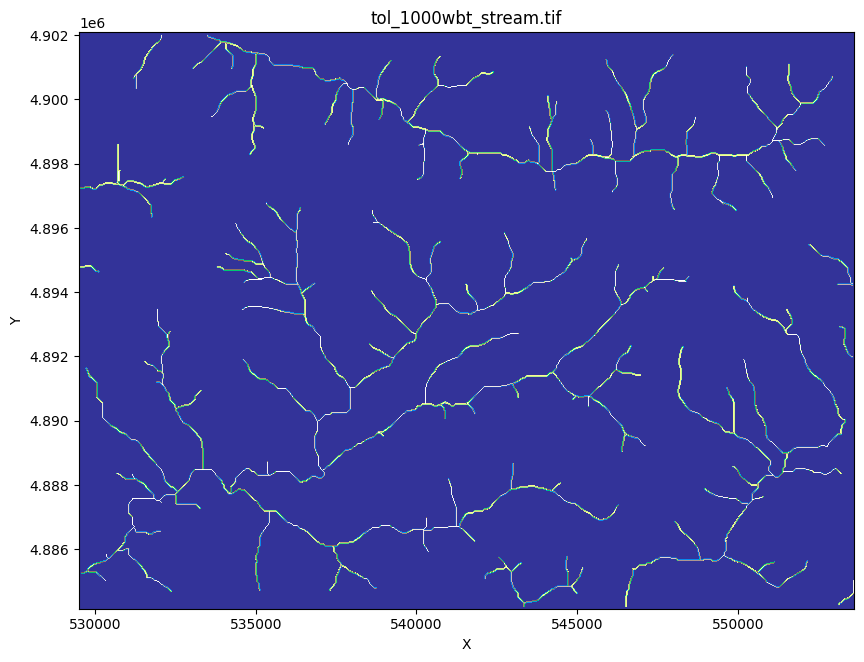

Number of labels: 50


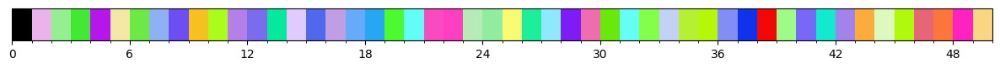

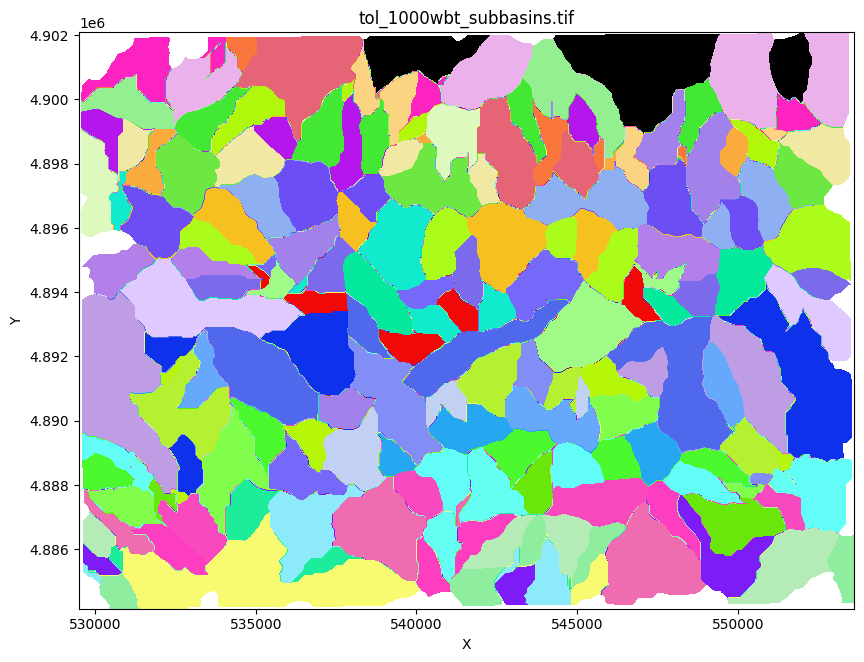

Number of labels: 50


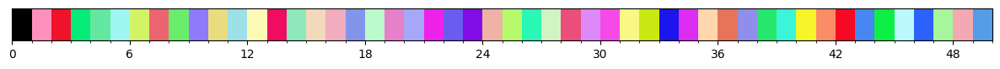

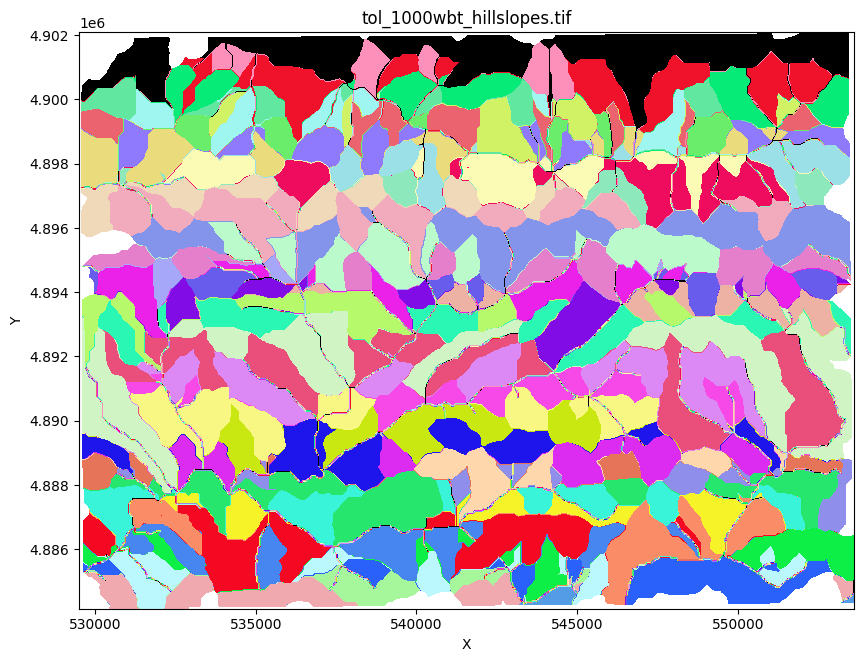

In [ ]:

plot_geotiff(wbt_slope,'terrain')
plot_geotiff(wbt_aspect,'terrain')
plot_geotiff(wbt_curvature,'terrain')
plot_geotiff(wbt_ehorizen,'terrain')
plot_geotiff(wbt_whorizen,'terrain')
plot_geotiff(wbt_rpt,'terrain')
plot_geotiff(wbt_d8_fdir,'terrain')
plot_geotiff(wbt_d8_acc,'terrain')
plot_geotiff(wbt_sedtransidx,'terrain')
plot_geotiff(wbt_TWI,'terrain')


for tol in [1000]:
  plot_geotiff("tol_" + str(tol) + wbt_stream,'terrain')
  new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
  plot_geotiff("tol_" + str(tol) + wbt_subbasins,new_cmap,masked=True)
  new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
  plot_geotiff("tol_" + str(tol) + wbt_hillslopes,new_cmap,masked=True)

##Generate drainage boundary to the gage station

In [ ]:

wbt_snapped_pour = "wbt_snapped_pour.shp"
wbt_basin = "wbt_basin.tif"
wbt_masked_subbasin = "wbt_masked_subbasin.tif"
#need decide which details to use
selected_tol = 1000
snap_dist = 30 * target_resolution

if not debug:
  #snap pour site to stream
  wbt.jenson_snap_pour_points(
      pour_pts, 
      "tol_" + str(selected_tol) + wbt_stream, 
      wbt_snapped_pour, 
      snap_dist=snap_dist
  )



  #Basins to the pour
  wbt.watershed(
      wbt_d8_fdir, 
      wbt_snapped_pour, 
      wbt_basin, 
      esri_pntr=False
  )


  #Mask out pixels outside of the basin
  wbt.max(
      wbt_basin, 
      "tol_" + str(selected_tol) + wbt_subbasins, 
      wbt_masked_subbasin
  )

  #"""

./whitebox_tools --run="JensonSnapPourPoints" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --pour_pts='USGSgage.shp' --streams='tol_1000wbt_stream.tif' --output='wbt_snapped_pour.shp' --snap_dist='900' -v --compress_rasters=False

***********************************
* Welcome to JensonSnapPourPoints *
* Powered by WhiteboxTools        *
* www.whiteboxgeo.com             *
***********************************
Reading data...
Progress: 0%
Saving data...
Output file written
Elapsed Time (excluding I/O): 0.0s
./whitebox_tools --run="Watershed" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --d8_pntr='wbt_d8_fdir.tif' --pour_pts='wbt_snapped_pour.shp' --output='wbt_basin.tif' -v --compress_rasters=False

****************************
* Welcome to Watershed     *
* Powered by WhiteboxTools *
* www.whiteboxgeo.com      *
****************************
Reading data...
Locating pour points: 0%
Initializing: 1%
Initializing: 2%
Initializing: 3%
Initializing: 4%
Initiali

Number of labels: 50


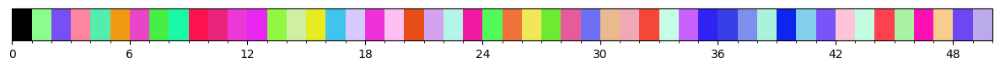

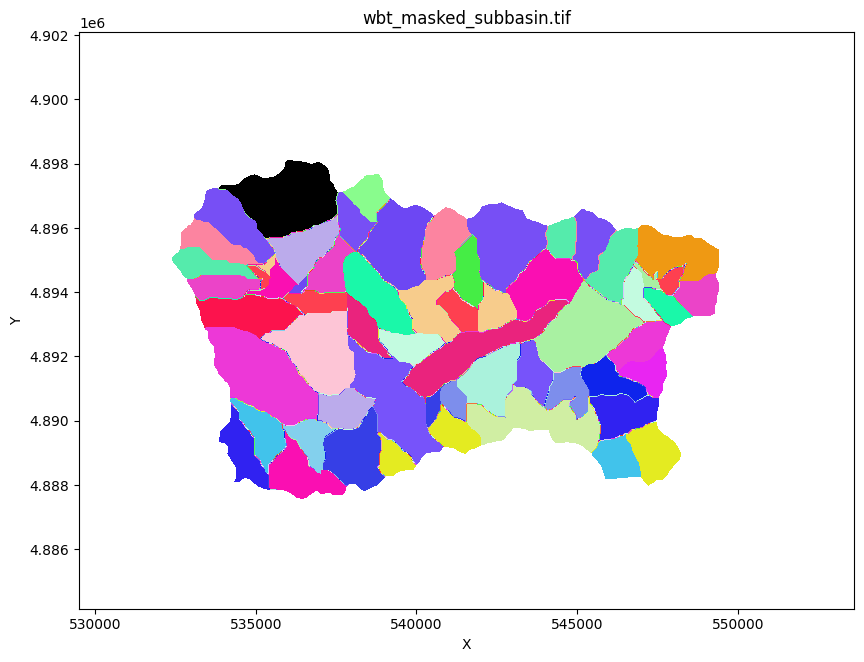

In [ ]:
new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
plot_geotiff(wbt_masked_subbasin,new_cmap,masked=True)

##Create Nibble function to fill the zero or hole with neighboring cells

In [ ]:
def Nibble(intiff,outtiff):
  wbt.raster_to_vector_points(
    intiff, 
    "/tmp/tempnibble.shp"
  )
  wbt.nearest_neighbour_gridding(
    "/tmp/tempnibble.shp", 
    "VALUE", 
    outtiff, 
    use_z=False, 
    cell_size=None, 
    base=intiff, 
    max_dist=None
  )
  %rm /tmp/tempnibble.*

##Set small area of grid cells as zero

In [ ]:
def SetSmallClumpZero(intiff,outtiff,diag,tol_numcells):
  wbt.clump(
    intiff, 
    "/tmp/tempsmall.tif", 
    diag=diag, 
    zero_back=False
  )
  wbt.raster_area(
    "/tmp/tempsmall.tif", 
    output="/tmp/tempsmall_area.tif", 
    out_text=False, 
    units="grid cells", 
    zero_back=False
  )

  wbt.conditional_evaluation(
    "/tmp/tempsmall_area.tif", 
    outtiff, 
    statement=f"value >= {tol_numcells}", 
    true=intiff, 
    false=0
  )

  %rm /tmp/tempsmall.tif /tmp/tempsmall_area.tif

##Create function to remove small areas and fill the holes with neighboring cells

In [ ]:
def EliminateAndFilleWithNeighbors(intiff,outtiff,diag,tol_numcells):
  SetSmallClumpZero(intiff
                  ,"/tmp/tempelim.tif"
                  ,diag
                  ,tol_numcells)
  Nibble("/tmp/tempelim.tif",outtiff)
  %rm /tmp/tempelim.tif

##Asign stream to neighboring cell for hillslopes and also remove small area of gridcells

In [ ]:
cleaned_hillslop = "cleaned_hillslop.tif"
clean_subbasin = "cleaned_subbasin.tif"

final_sel_cleaned_hillslopes = "tol_" + str(selected_tol) + cleaned_hillslop
final_sel_cleaned_subbasins = "tol_" + str(selected_tol) + clean_subbasin

tol_smallarea_numcells = 10
if not debug:
  #Hillslopes
  EliminateAndFilleWithNeighbors("tol_" + str(selected_tol) + wbt_hillslopes
                                ,final_sel_cleaned_hillslopes
                                ,True
                                ,tol_smallarea_numcells)

  EliminateAndFilleWithNeighbors("tol_" + str(selected_tol) + wbt_subbasins
                                ,final_sel_cleaned_subbasins
                                ,True
                                ,tol_smallarea_numcells)


./whitebox_tools --run="Clump" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --input='tol_1000wbt_hillslopes.tif' --output='/tmp/tempsmall.tif' --diag -v --compress_rasters=False

****************************
* Welcome to Clump         *
* Powered by WhiteboxTools *
* www.whiteboxgeo.com      *
****************************
Reading data...
Performing analysis: 0%
Performing analysis: 1%
Performing analysis: 2%
Performing analysis: 3%
Performing analysis: 4%
Performing analysis: 5%
Performing analysis: 6%
Performing analysis: 7%
Performing analysis: 8%
Performing analysis: 9%
Performing analysis: 10%
Performing analysis: 11%
Performing analysis: 12%
Performing analysis: 13%
Performing analysis: 14%
Performing analysis: 15%
Performing analysis: 16%
Performing analysis: 17%
Performing analysis: 18%
Performing analysis: 19%
Performing analysis: 20%
Performing analysis: 21%
Performing analysis: 22%
Performing analysis: 23%
Performing analysis: 24%
Performing analysis: 25%
Perf

Number of labels: 50


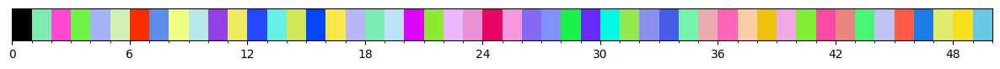

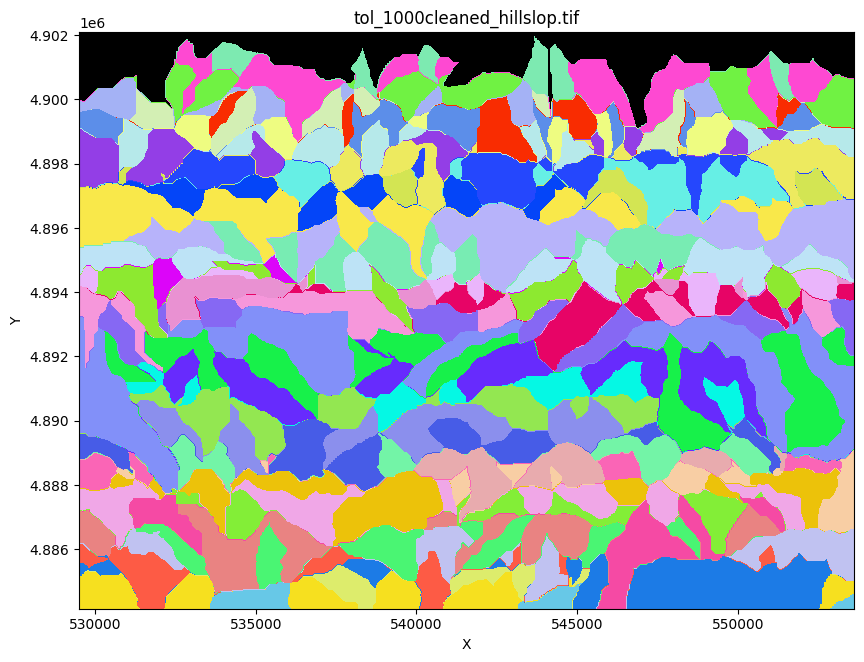

Number of labels: 50


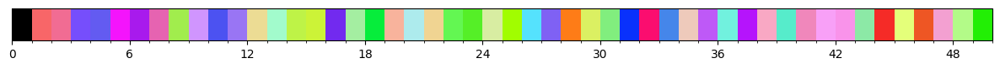

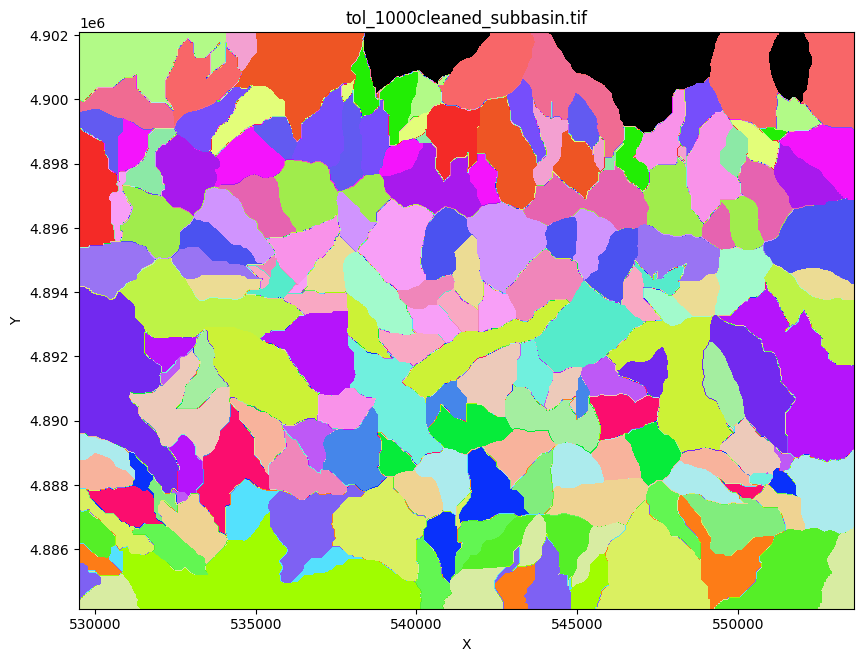

In [ ]:
new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
plot_geotiff(final_sel_cleaned_hillslopes,new_cmap,masked=True)
new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
plot_geotiff(final_sel_cleaned_subbasins,new_cmap,masked=True)

## Download NDVI dat sets

In [ ]:
#get NDVI

#1984-01-01T00:00:00Z–2012-04-30T00:00:00
#ee.ImageCollection("LANDSAT/LT05/C01/T1_8DAY_NDVI")

#1999-01-01T00:00:00Z–2021-12-27T00:00:00
#ee.ImageCollection("LANDSAT/LE07/C01/T1_8DAY_NDVI")

#2013-04-07T00:00:00Z–2022-01-01T00:00:00
#ee.ImageCollection("LANDSAT/LC08/C01/T1_8DAY_NDVI")

#2021-10-31T00:00:00Z–2023-03-18T23:18:44
#ee.ImageCollection("LANDSAT/LC09/C02/T1_L2")

# Load the Landsat 5 collection
ndvidata_dir = geedata_dir
#if not os.path.exists(ndvidata_dir):
#    os.makedirs(ndvidata_dir, exist_ok=True)

downloadndvi = False
download_year = 2020
start_date = str(download_year) + '-01-01'
end_date = str(download_year) + '-12-31'

if not debug and downloadndvi:
  # Load the Landsat 5 collection
  if download_year in range(1984,2012):
    #start_date = str(download_year) + '-01-01'
    #end_date = str(download_year) + '-12-31'
    collection = ee.ImageCollection('LANDSAT/LT05/C01/T1_8DAY_NDVI') \
      .filterDate(start_date, end_date) \
      .filterBounds(geometry)

    # Get the max image in the collection
    image = ee.Image(collection.max().select('NDVI')).clip(geometry)
    outfile_name = 'NDVI' + str(download_year) + '_L5'
    download_url_dem = image.getDownloadURL({
      'name': outfile_name, # set a name for the downloaded file
      'scale': 30, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
    })
    # Download the image to your local machine
    urllib.request.urlretrieve(download_url_dem, ndvidata_dir + '/' + outfile_name + '.tif')

  # Load the Landsat 7 collection
  #for year in range(1999,2021):
  if download_year in range(2021,2022):
    #start_date = str(download_year) + '-01-01'
    #end_date = str(download_year) + '-12-31'
    collection = ee.ImageCollection('LANDSAT/LE07/C01/T1_8DAY_NDVI') \
      .filterDate(start_date, end_date) \
      .filterBounds(geometry)

    # Get the max image in the collection
    image = ee.Image(collection.max().select('NDVI')).clip(geometry)
    outfile_name = 'NDVI' + str(download_year) + '_L7'
    download_url_dem = image.getDownloadURL({
      'name': outfile_name, # set a name for the downloaded file
      'scale': 30, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
    })
    # Download the image to your local machine
    urllib.request.urlretrieve(download_url_dem, ndvidata_dir + '/' + outfile_name + '.tif')

  # Load the Landsat 8 collection
  if download_year in range(2013,2022):
    #start_date = str(download_year) + '-01-01'
    #end_date = str(download_year) + '-12-31'
    collection = ee.ImageCollection('LANDSAT/LC08/C01/T1_8DAY_NDVI') \
      .filterDate(start_date, end_date) \
      .filterBounds(geometry)

    # Get the max image in the collection
    image = ee.Image(collection.max().select('NDVI')).clip(geometry)
    outfile_name = 'NDVI' + str(download_year) + '_L8'
    download_url_dem = image.getDownloadURL({
      'name': outfile_name, # set a name for the downloaded file
      'scale': 30, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
    })
    # Download the image to your local machine
    urllib.request.urlretrieve(download_url_dem, ndvidata_dir + '/' + outfile_name + '.tif')


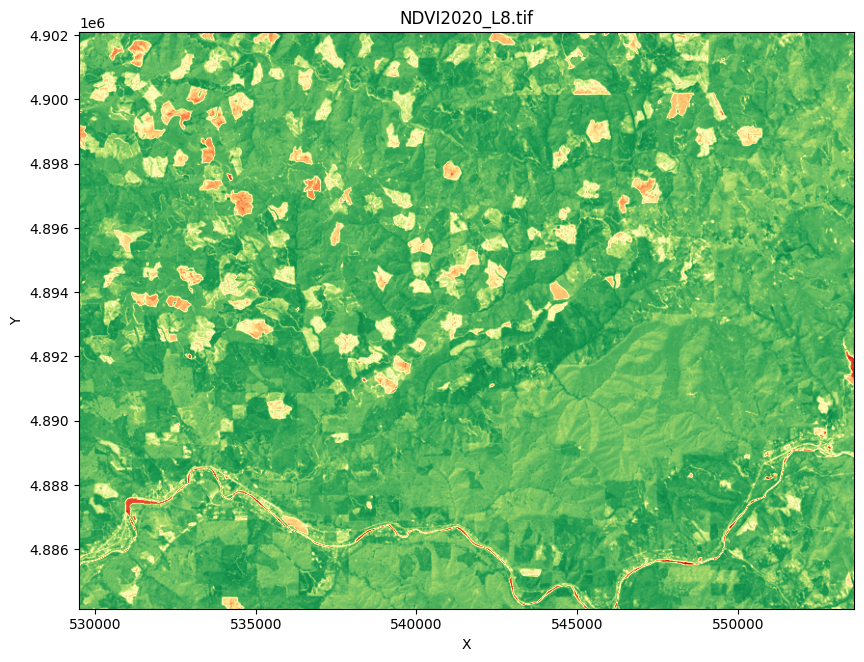

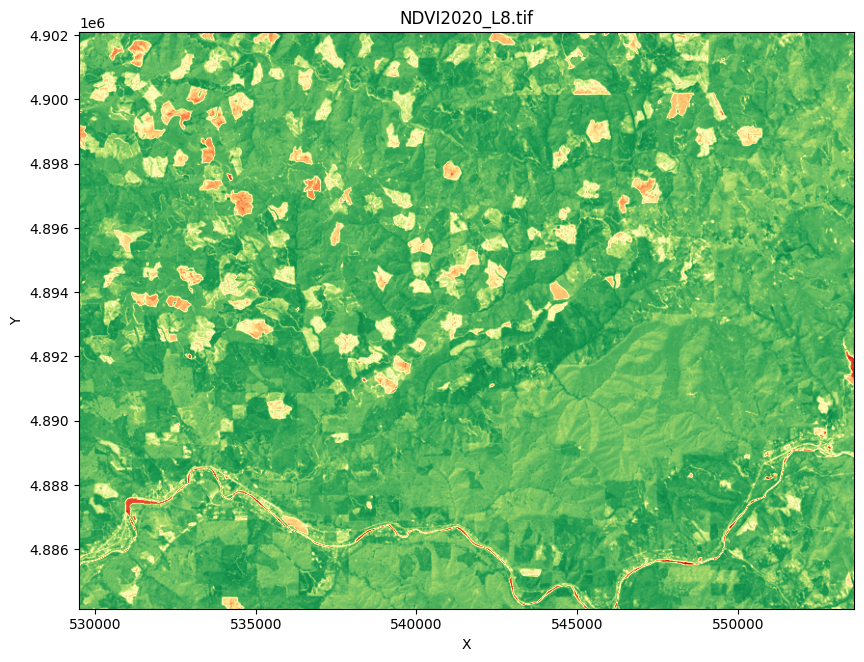

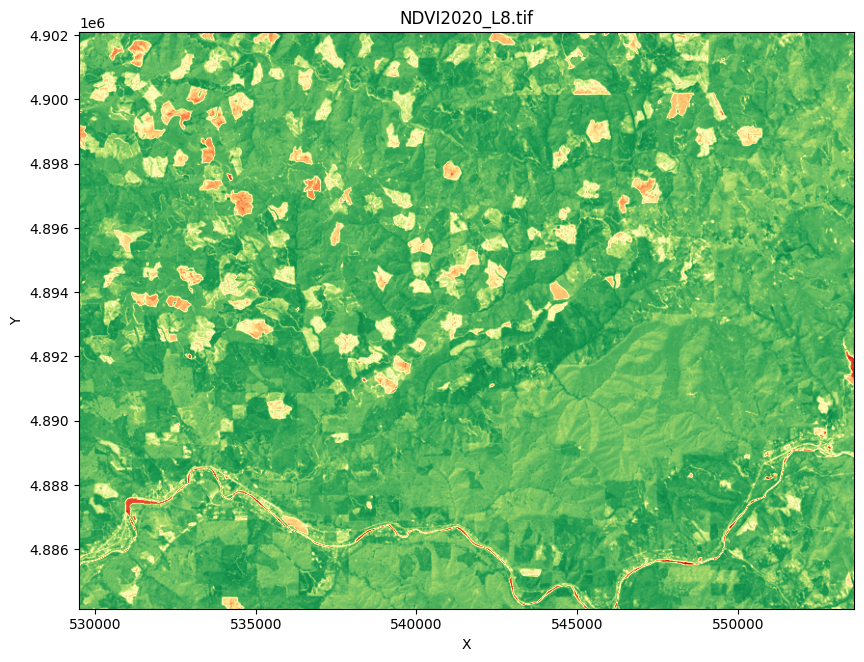

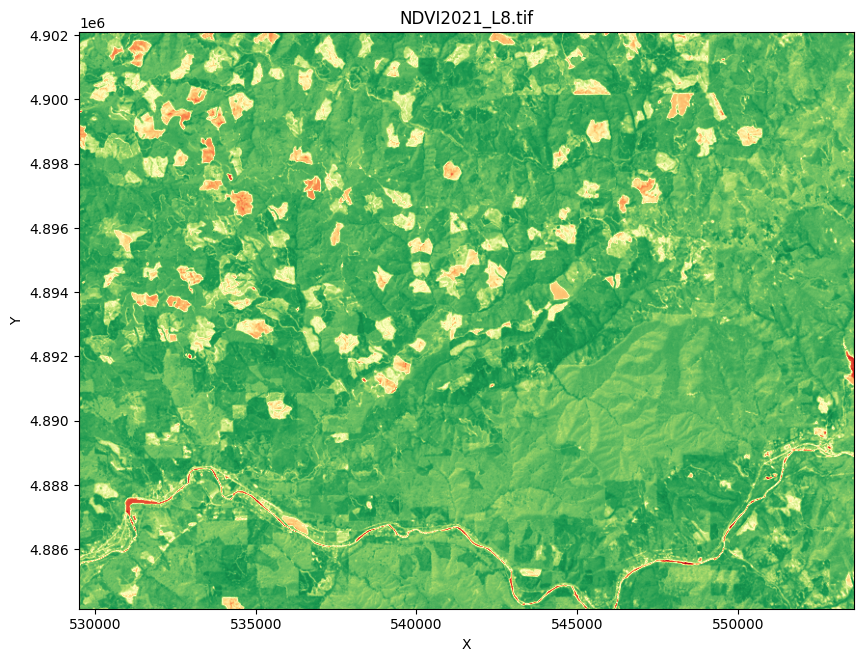

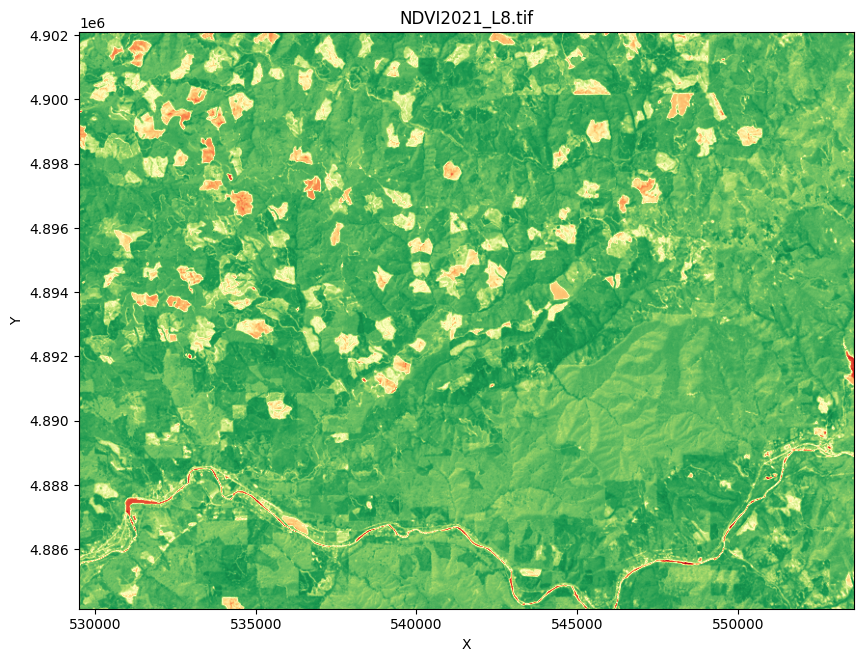

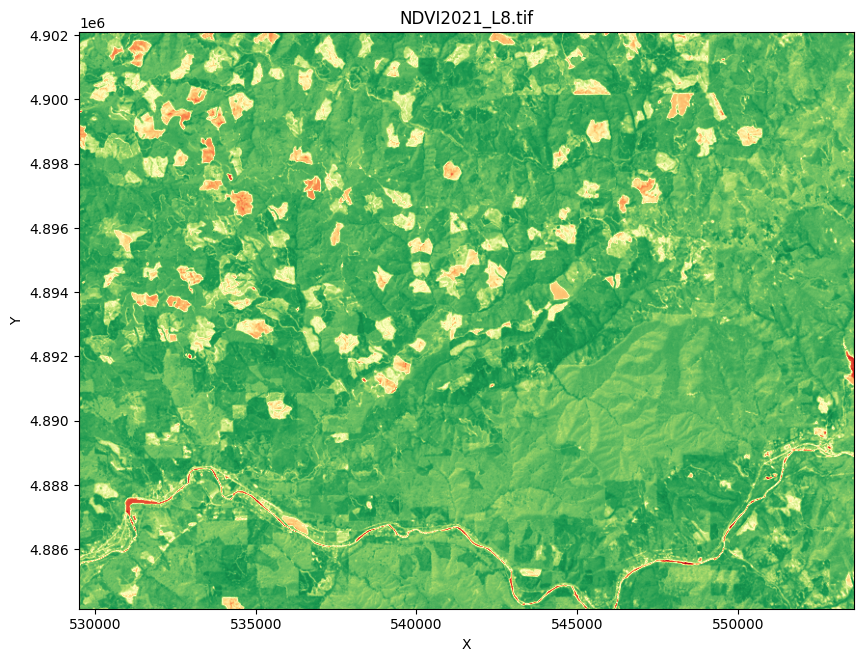

In [ ]:
for download_year in range(1984,2022):
  for landsat in ['L5','L7','L8']:
    outfile_name = 'NDVI' + str(download_year) + '_L8'
    tif = ndvidata_dir + '/' + outfile_name + '.tif'
    #print(tif)
    if os.path.exists(tif):
      plot_geotiff(tif,'RdYlGn')

##Download NLCD (landcover and imperviousness)



In [ ]:
downloadnlcd = False
ndvidata_dir = geedata_dir
if not debug and downloadnlcd:
  dataset = ee.ImageCollection('USGS/NLCD_RELEASES/2019_REL/NLCD')
  for year in ['2001','2004','2006','2008','2011','2013','2016','2019']:
      nlcd = dataset.filter(ee.Filter.eq('system:index', year)).first().select('landcover').clip(geometry)
      outfile_name = 'NLCD_' + year
      download_url_nlcd = nlcd.getDownloadURL({
        'name': outfile_name, # set a name for the downloaded file
        'scale': 30, # set the resolution of the downloaded image in meters
        'crs' : userprojection.crs().getInfo(),
        'format': 'GeoTIFF', # set the output format to GeoTIFF
        'region': geometry # set the region of interest
      })
      # Download the image to your local machine
      urllib.request.urlretrieve(download_url_nlcd, ndvidata_dir + '/' + outfile_name + '.tif')

      #imperviouness
      imp = dataset.filter(ee.Filter.eq('system:index', year)).first().select('impervious').clip(geometry).multiply(0.01)
      outfile_name = 'impervious_' + year
      download_url_imp = imp.getDownloadURL({
        'name': outfile_name, # set a name for the downloaded file
        'scale': 30, # set the resolution of the downloaded image in meters
        'crs' : userprojection.crs().getInfo(),
        'format': 'GeoTIFF', # set the output format to GeoTIFF
        'region': geometry # set the region of interest
      })
      # Download the image to your local machine
      urllib.request.urlretrieve(download_url_imp, ndvidata_dir + '/' + outfile_name + '.tif') 

Number of labels: 10


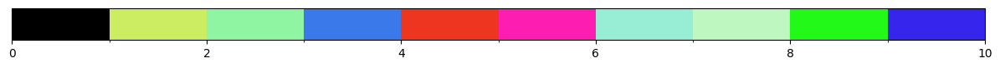

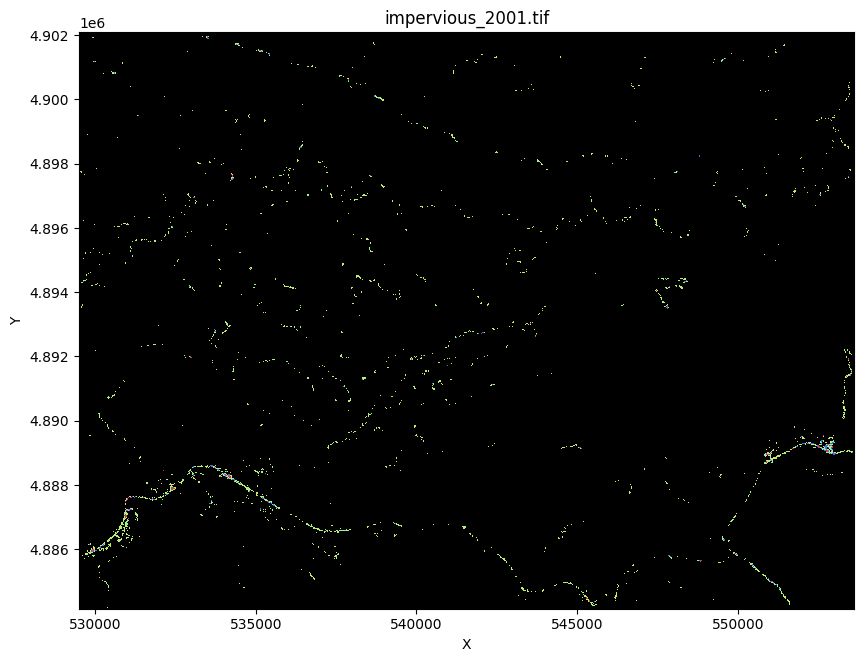

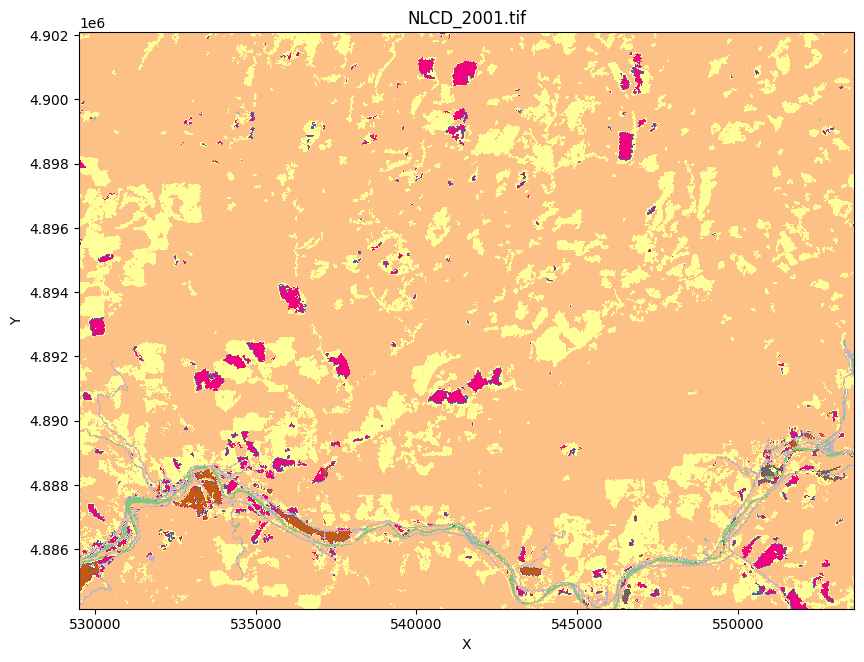

Number of labels: 10


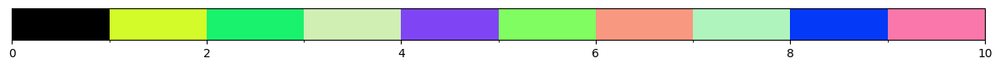

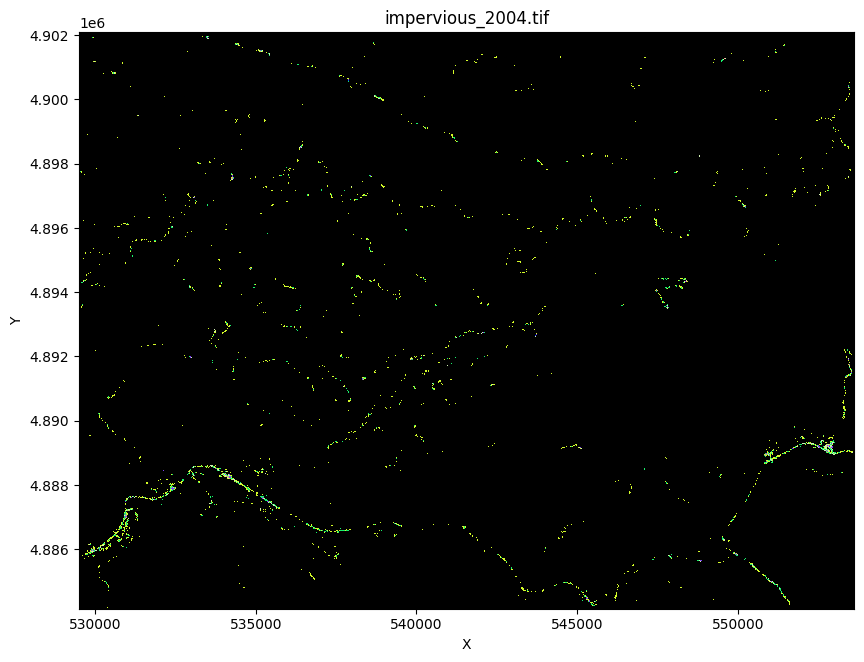

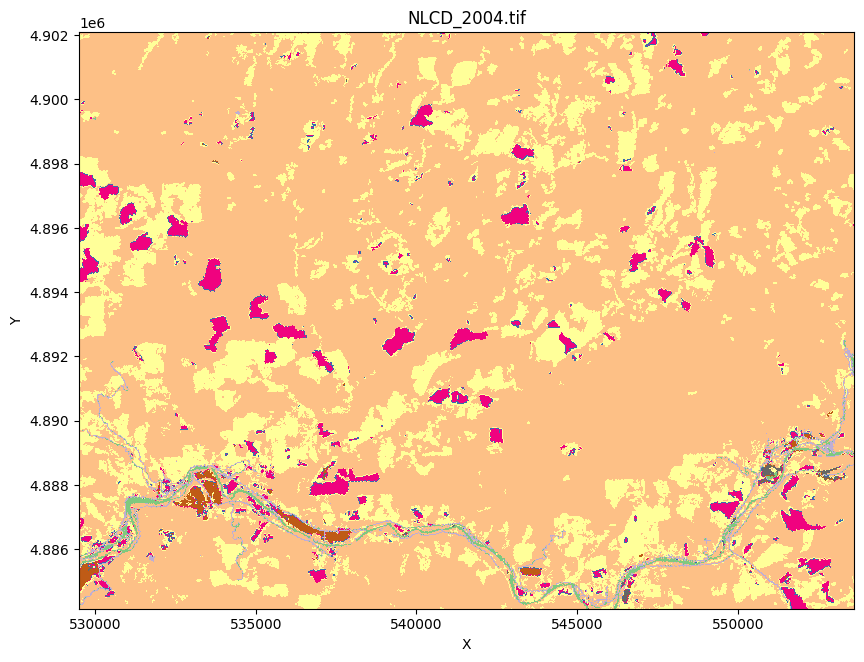

Number of labels: 10


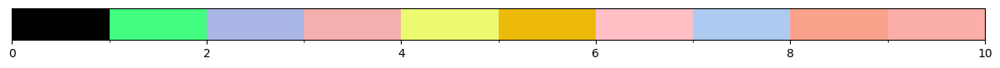

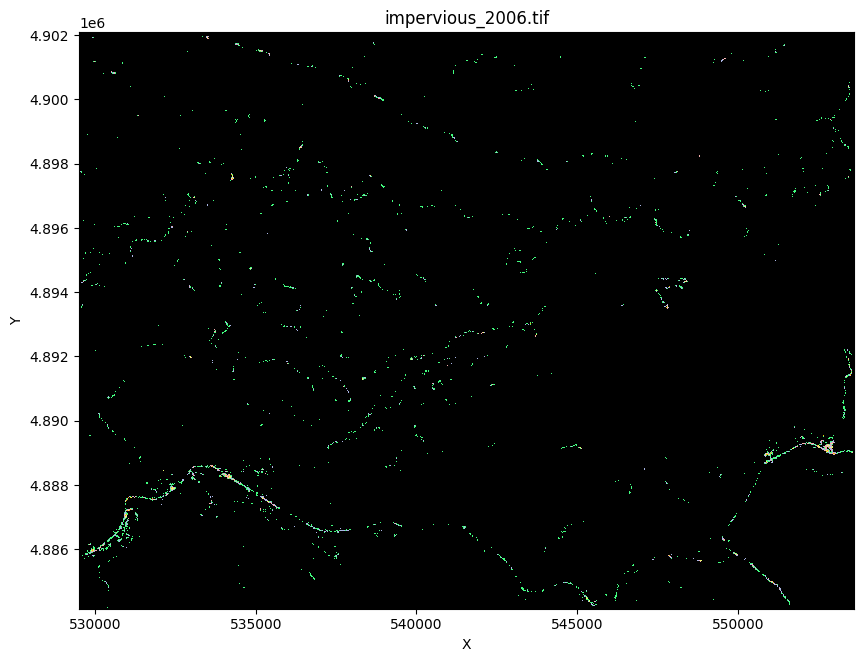

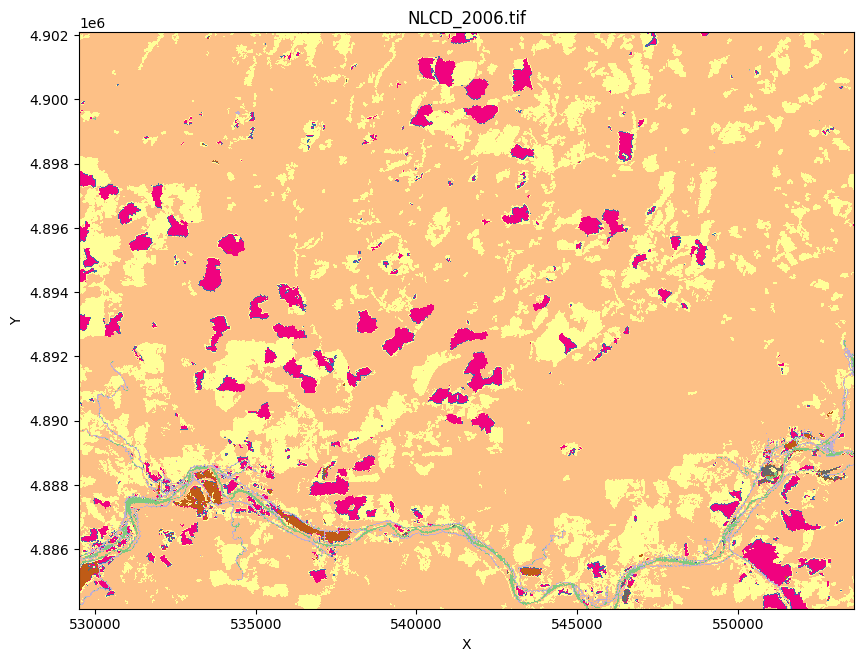

Number of labels: 10


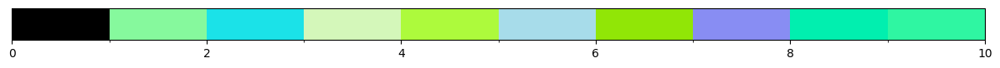

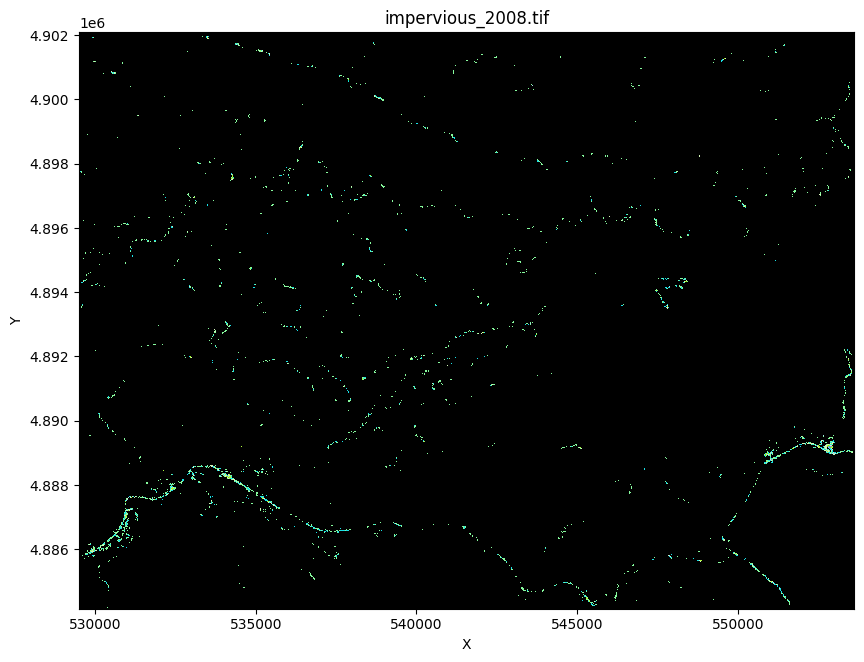

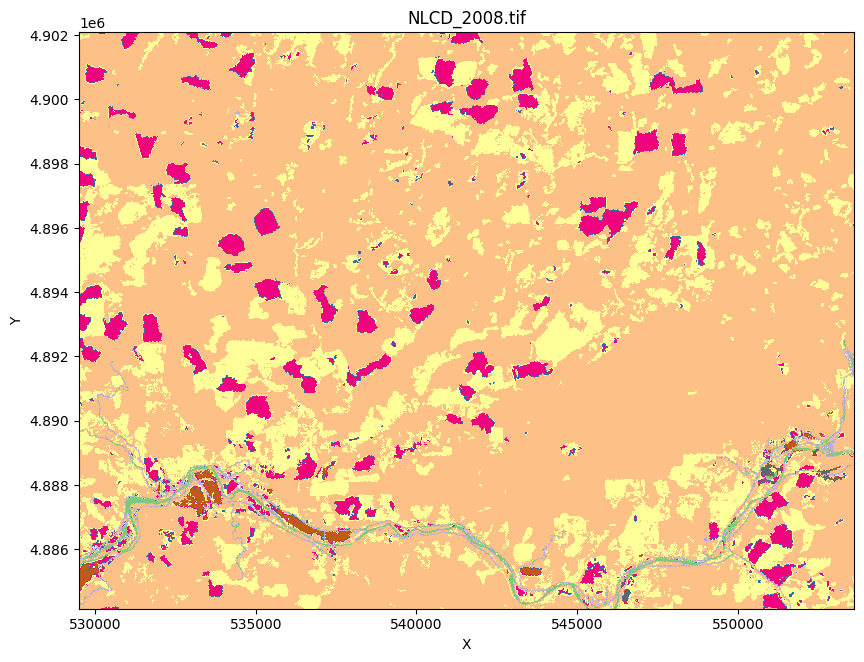

Number of labels: 10


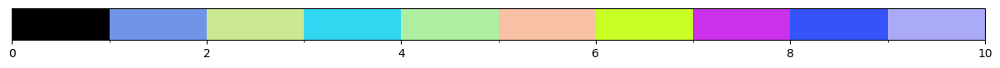

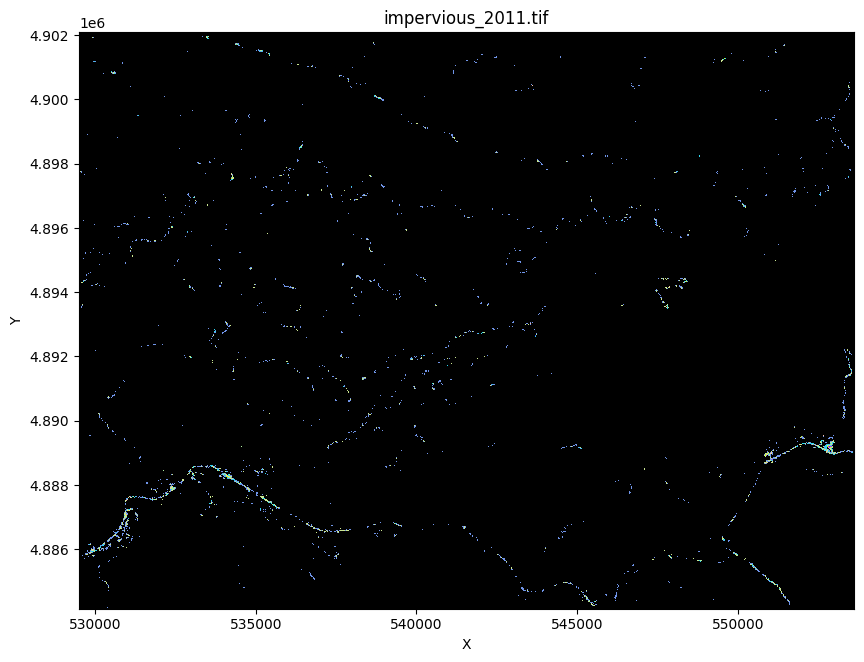

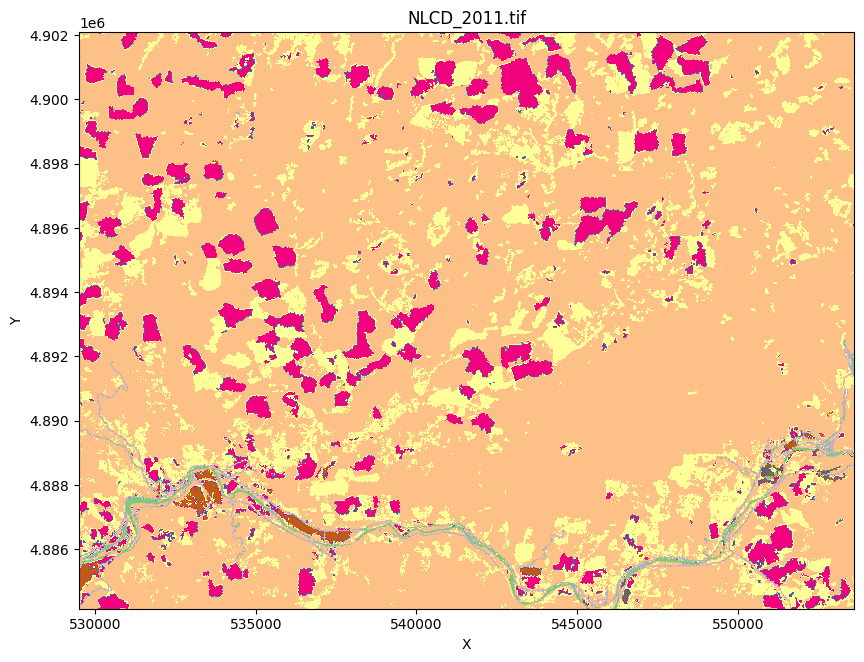

Number of labels: 10


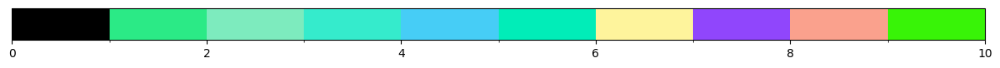

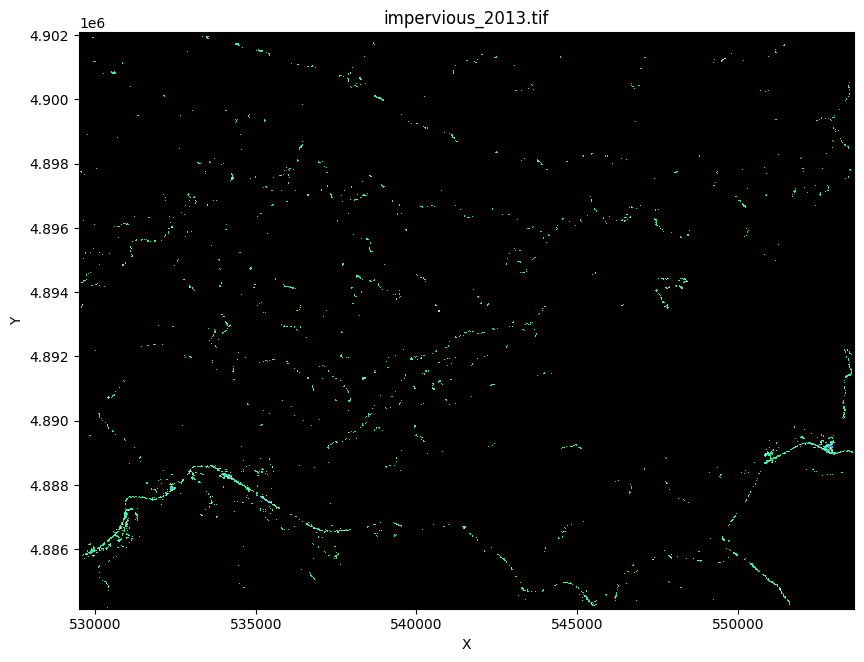

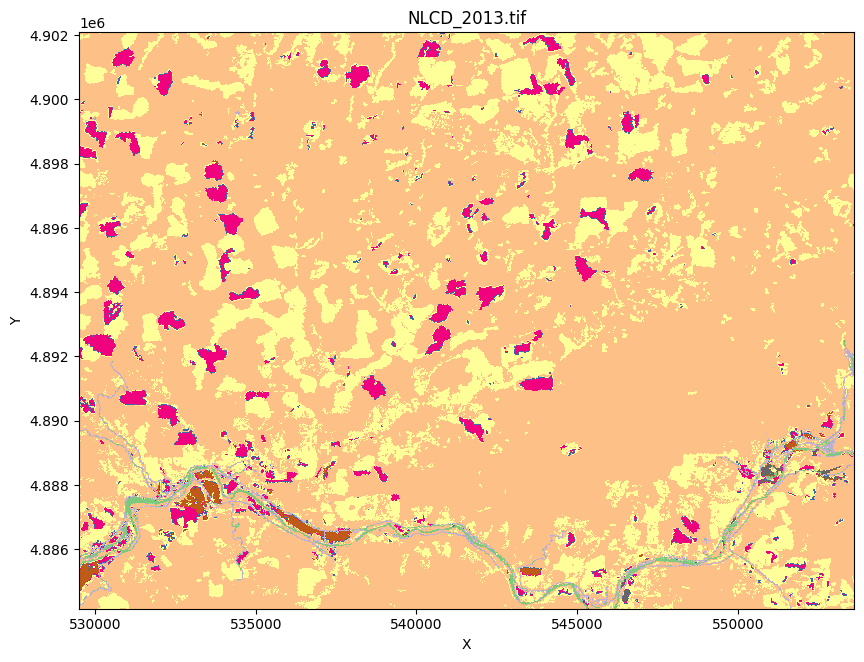

Number of labels: 10


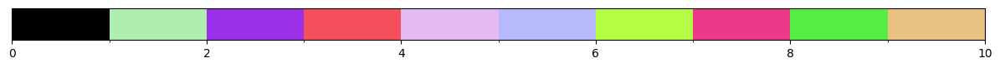

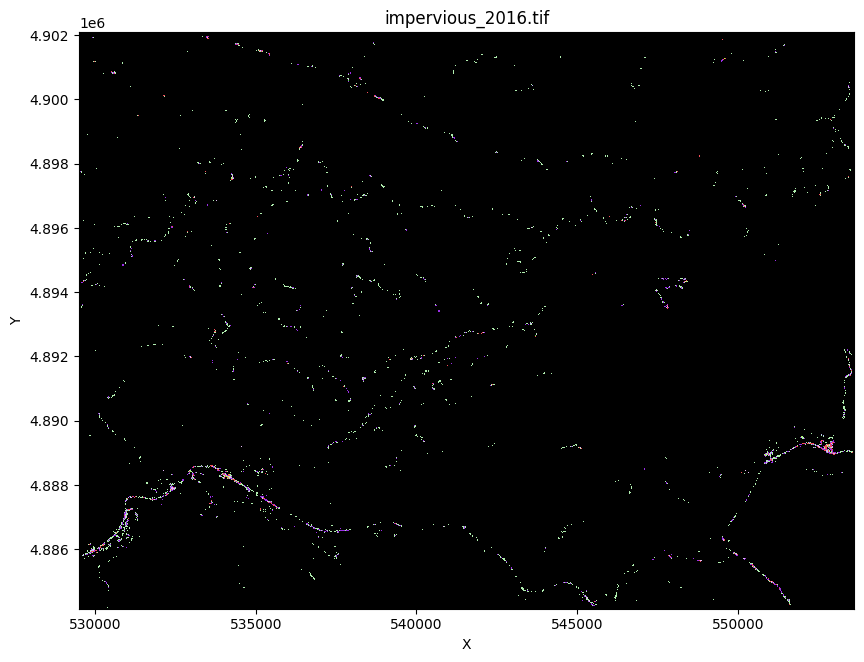

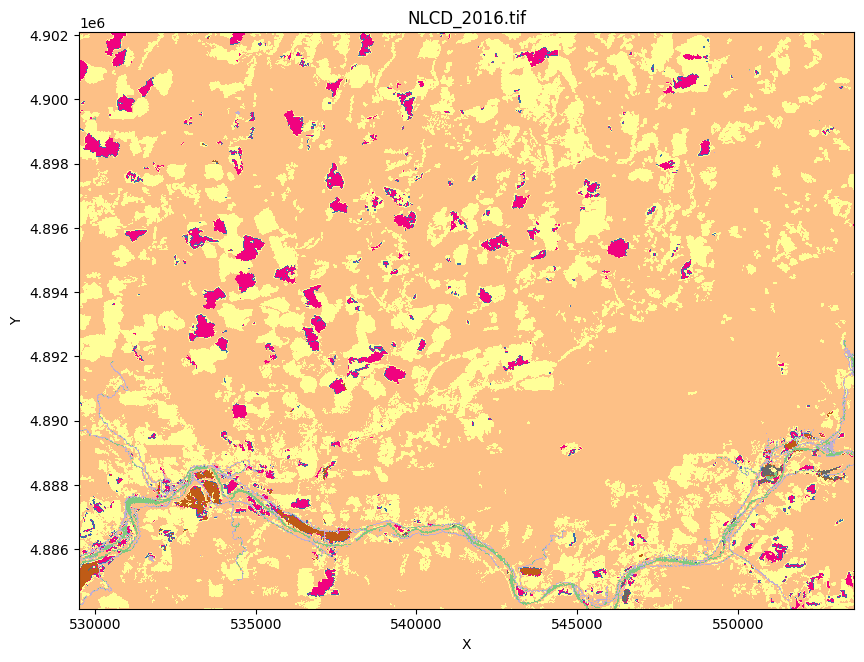

Number of labels: 10


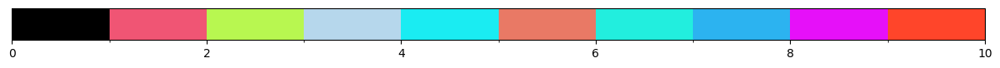

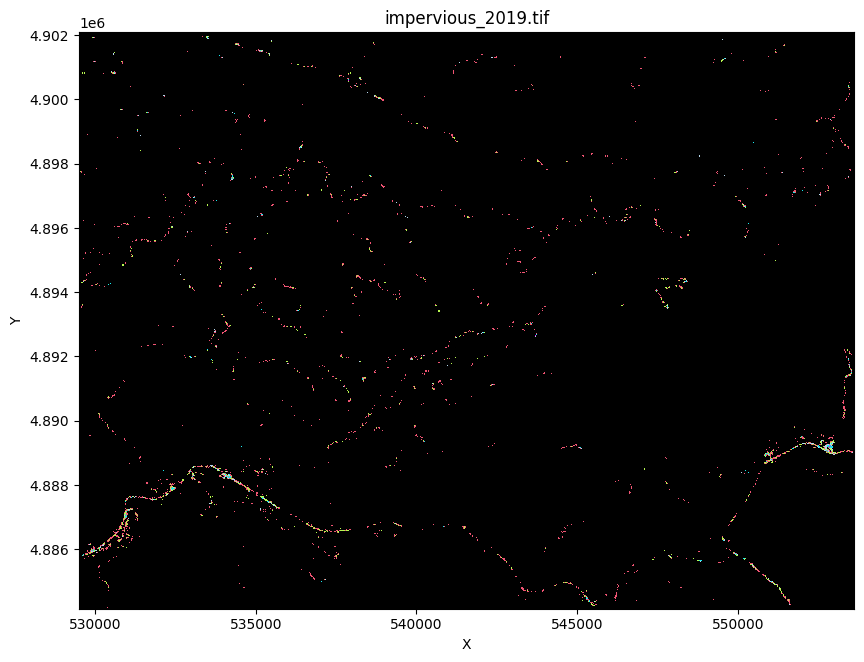

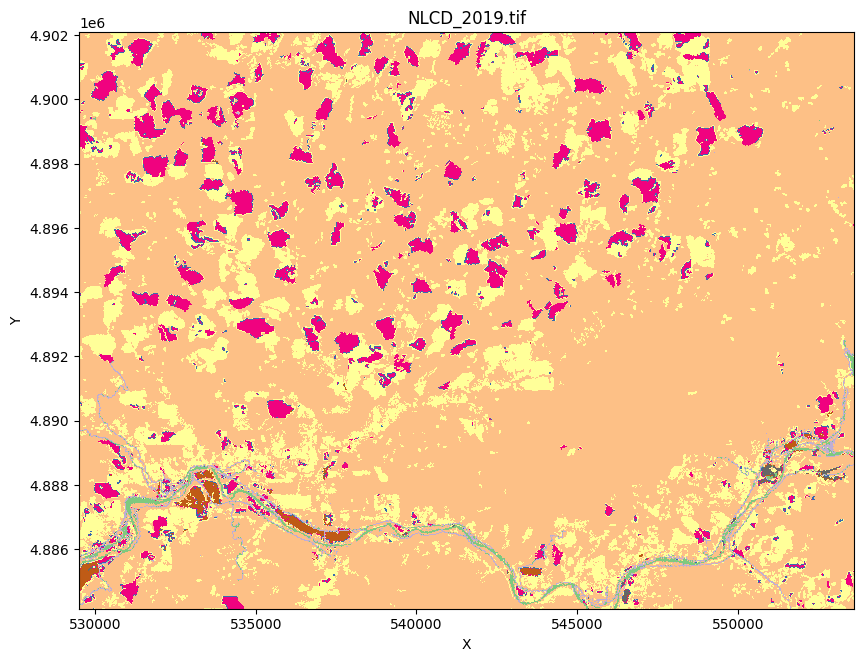

In [ ]:

for download_year in ['2001','2004','2006','2008','2011','2013','2016','2019']:
  for lulc in ['impervious_','NLCD_']:
    outfile_name = lulc + download_year
    tif = ndvidata_dir + '/' + outfile_name + '.tif'
    #print(tif)
    if os.path.exists(tif):
      if lulc == 'NLCD_':
        plot_geotiff(tif,'Accent')
      else:
        new_cmap = rand_cmap(10, type='bright', first_color_black=True, last_color_black=False, verbose=True)
        plot_geotiff(tif,new_cmap)

##Download GridMet data and convert it to RHESSys netCDF format

In [ ]:
# Define the start and end dates
import xarray as xr

try:
  import rioxarray as rxr
except ImportError as e:
  !pip install rioxarray
  import rioxarray as rxr

#!pip install cftime==1.4.1
try:
  import cftime
except ImportError as e:
  !pip install cftime
  import cftime  
import numpy as np
import datetime as dt
from datetime import datetime,timedelta


gridmet_vars = {
    'tmmx' : 'air_temperature'
    ,'tmmn' : 'air_temperature'
    ,'pr' : 'precipitation_flux'
    ,'rmax' : 'relative_humidity'
    ,'rmin' : 'relative_humidity'
    ,'sph' : 'specific_humidity'
    ,'srad' : 'surface_downwelling_shortwave_flux_in_air'
    ,'vs' : 'wind_speed'
}

gridmet_vars_unit = {
    'tmmx' : 'K'
    ,'tmmn' : 'K'
    ,'pr' : 'kg m-2 s-1'
    ,'rmax' : '%'
    ,'rmin' : '%'
    ,'sph' : '1'
    ,'srad' : 'W m-2'
    ,'vs' : 'm s-1'
}

download_gridmet = False

if not debug and download_gridmet:
  start_date = '1979-01-01'
  end_date = '1980-12-31'
  #end_date = '2022-12-31'

  start_year = int(start_date[0:4])
  end_year = int(end_date[0:4])
  # Define start and end dates

  tstart_date = dt.datetime.strptime(start_date, "%Y-%m-%d")
  tend_date = dt.datetime.strptime(end_date, "%Y-%m-%d")

  #GEE filterdate does not count the last day, so add one day for filter
  gee_end_date = (tend_date + timedelta(days=1)).strftime('%Y-%m-%d')
  #print(f'gee_end_date:{gee_end_date}')

  # Generate array of dates in "days since 1900-01-01 00:00:00" format
  days_since_1900 = (tstart_date - dt.datetime(1900, 1, 1)).days
  days = np.arange(days_since_1900, days_since_1900 + (tend_date - tstart_date).days + 1)
  #print(f"size_of_days:{days.size} day:{days}")

  # Define the GridMET dataset

  first_run_generate_basestation_map = True
  nclats = list()
  nclons = list()
  for var in gridmet_vars:
    # Filter the dataset by date and region of interest
    outvarname = gridmet_vars[var]
    out_nc = f'{geedata_dir}/{var}_{start_date[0:4]}_{end_date[0:4]}.nc'

    #Process year by year
    for year in range(start_year,end_year+1):
      #Set up datetime
      sub_start_date = f'{year}-01-01'
      sub_end_date = f'{year}-12-31'
      sub_tstart_date = dt.datetime.strptime(sub_start_date, "%Y-%m-%d")
      sub_tend_date = dt.datetime.strptime(sub_end_date, "%Y-%m-%d")
      sub_gee_end_date = (sub_tend_date + timedelta(days=1)).strftime('%Y-%m-%d')
      sub_days_since_1900 = (sub_tstart_date - dt.datetime(1900, 1, 1)).days
      sub_days = np.arange(days_since_1900, days_since_1900 + (sub_tend_date - sub_tstart_date).days + 1)
      
      print(f'sub_start_date:{sub_start_date} sub_gee_end_date:{sub_gee_end_date}')


      #gridmet = ee.ImageCollection('IDAHO_EPSCOR/GRIDMET')
      gridmet_filtered = ee.ImageCollection('IDAHO_EPSCOR/GRIDMET').filterDate(sub_start_date, sub_gee_end_date).select(var)


      print(f"number of images:{gridmet_filtered.size().getInfo()}")
      images = gridmet_filtered.toBands().clip(geometry)
      #print(images.getInfo())
      #print(f'crs:{images.projection().getInfo()} transform: {images.projection().transform().getInfo()}')
      nominal_scale = images.projection().nominalScale().getInfo()
      # Get the download URL for the image
      url = images.getDownloadURL({
        'name': 'gridmet', # set a name for the downloaded file
        'crs' : wgs84.crs().getInfo(),
        'crsTransform': wgs84.transform,
        'format': 'GeoTIFF', # set the output format to GeoTIFF
        'region' : geometry,
        'scale' : nominal_scale
      })
      #%rm /tmp/tempnc.tif
      urllib.request.urlretrieve(url, '/tmp/tempnc.tif')
      time.sleep(2)

      rio = rxr.open_rasterio('/tmp/tempnc.tif')
      #print(rio)
      rio = rio.rename({'y' : 'lat','x' : 'lon', 'band' : 'time'})

      #get coordinates
      if first_run_generate_basestation_map:
        nclats = rio.coords['lat'].values.tolist()
        nclons = rio.coords['lon'].values.tolist()
        first_run_generate_basestation_map = False
      #set time as days from 1900
      rio = rio.assign_coords(time=sub_days)
      
      rio.name = outvarname

      if var == 'pr':
        #mm/day -> kg/m2/s
        rio /= 86400.0 

      print(f'var:{gridmet_vars[var]} unit:{gridmet_vars_unit[var]}')
      #print(f'rio:{rio}')
      
      rio.attrs['nodatavals'] = 'NaN'
      rio.attrs['scales'] = 1.0
      rio.attrs['offsets'] = 0.0
      rio.attrs["units"] = gridmet_vars_unit[var]
      rio.attrs['note'] = 'This is a subset from GridMet by Mingliang Liu (WSU)' + datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
      if year == start_year:
        allroi = rio.copy()
      else:
        # Append the new data to the existing variable in the dataset
        temp = xr.concat([allroi, rio], dim='time')
        allroi = temp.copy()

      #print(f'allroi:{allroi}')
      %rm /tmp/tempnc.tif


    allroi.to_netcdf(out_nc)





Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 KB 1.5 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 9.5 MB/s eta 0:00:00


## Generate NC spatial data for basestation info text file

In [ ]:
nc_fc_name = 'gridmet_prj'
if not debug and download_gridmet:
  #Genrate nc grid spatial data
  print(f'lats:{nclats}\nlons:{nclons}')
  station_cor_geo = dict() #lon,lat
  station_cor_prj = dict() #x,y
  index = 0
  pfc = list()
  for lat in nclats:
    for lon in nclons:
      index += 1

      outlet = ee.Geometry.Point([lon, lat], "EPSG:4326").transform(userprojection.crs().getInfo())
      #transformer has been defined earlier
      x, y = transformer.transform(lat,lon)

      station_cor_geo[index] = [lon,lat]
      station_cor_prj[index] = [x,y]

      #print(f"generated outlet projection:{outlet.projection().crs().getInfo()}")
      # Define a point feature with properties
      point_feature = ee.Feature(
        outlet,  
        {"name": 'gridmet_id', "id": index}   # Properties of the point feature
      )
      pfc.append(point_feature)
    # Create a feature collection from the point feature
  feature_collection = ee.FeatureCollection(pfc)

  if feature_collection.size().getInfo() > 0:
    # Export the FeatureCollection to Google Drive
    task = ee.batch.Export.table.toDrive(
      collection = feature_collection,
      description = nc_fc_name,
      driveFolder = "NCMAP",  # Folder name in Google Drive
      fileFormat = 'SHP'
    )
    task.start()

    # Wait for the export task to complete
    import time
    while task.active():
      print('Exporting...')
      time.sleep(5)
    time.sleep(10)
    # Check for errors
    if task.status()['state'] != 'COMPLETED':
      print('Export failed:', task.status()['error_message'])
    else:
      print('Export completed successfully!')

  %cp /content/drive/MyDrive/NCMAP/* "{geedata_dir}" 
  %rm -r /content/drive/MyDrive/NCMAP

##Create raster for gridmet and calculate mean LAI and elevation of each grid cell

In [ ]:
intpoint = f'{geedata_dir}/{nc_fc_name}.shp'
outgridmap = 'gridmet.tif'
outgridmapshp = 'gridmetpoly.shp'
lai_max = 'lai_max.tif'
lai_max_wbt = 'lai_max_wbt.tif'
gridmet_lai_mean = 'gridmet_lai_mean.html'
gridmet_elev_mean = 'gridmet_elev_mean.html'

if not debug and download_gridmet:
  #Without base seems the projection will be lost, but could be added later
  #Now seems okay to use already generated tif raster as the base
  wbt.nearest_neighbour_gridding(
    intpoint, 
    "id", 
    "tempgridmet.tif", 
    use_z=False, 
    cell_size=None, 
    base=wbt_slope,
    max_dist=None
  )

  #to int type
  wbt.truncate(
    "tempgridmet.tif", 
    outgridmap
  )
  %rm tempgridmet.tif

  wbt.raster_to_vector_polygons(
    outgridmap, 
    outgridmapshp
  )

  #download LAI from MODIS to calculate mean for each station
  # Get the max image in the collection
  laicollection = ee.ImageCollection('MODIS/061/MCD15A3H') \
                      .filterDate('2019-01-01','2021-12-31') \
                      .filterBounds(geometry)

  laiimage = ee.Image(laicollection.max().select('Lai')).clip(geometry).multiply(0.1)
  download_url_dem = laiimage.getDownloadURL({
      'name': lai_max[:-4], # set a name for the downloaded file
      'scale': target_resolution, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
  })
  # Download the image to your local machine
  urllib.request.urlretrieve(download_url_dem, f'{geedata_dir}/{lai_max}')

  #need convert lai to uncompressed
  GeoTiffToUncompressedTiff(lai_max,lai_max_wbt)

  #get the average LAI of each gridmet grid
  wbt.zonal_statistics(
    lai_max_wbt, 
    outgridmap, 
    output=gridmet_lai_mean[:-5] + '.tif', 
    stat="mean", 
    out_table=gridmet_lai_mean
  )

  #Get the average elevation of each gridmet grid
  wbt.zonal_statistics(
    smothed_elev_wbt, 
    outgridmap, 
    output=gridmet_elev_mean[:-5] + '.tif', 
    stat="mean", 
    out_table=gridmet_elev_mean
  )

Number of labels: 50


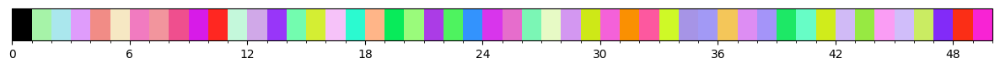

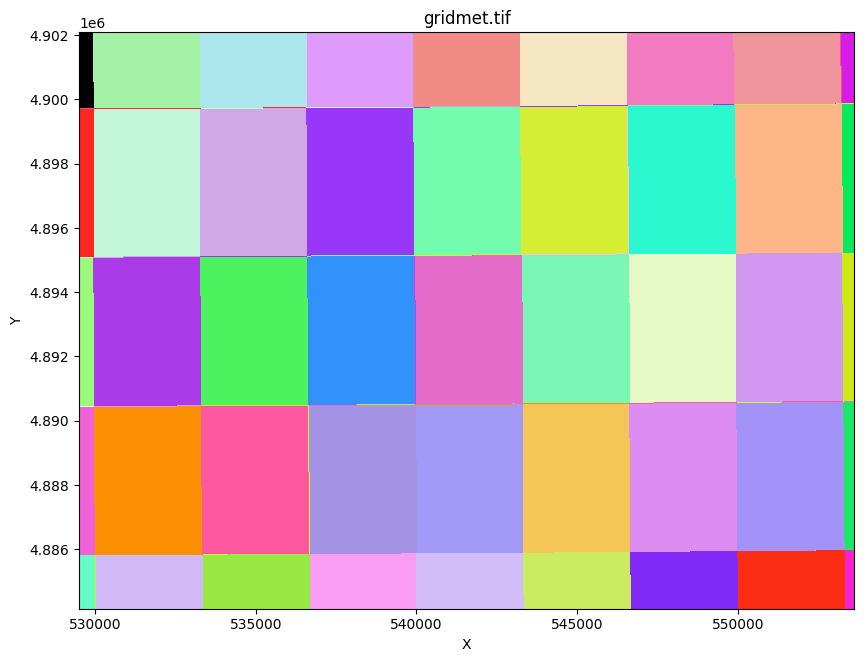

In [ ]:
new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
plot_geotiff(outgridmap,new_cmap)

##Read table to generate information for gridmet grid/station

###Function to get unique value list from a raster (tiff)

In [ ]:
import pandas as pd
import time
from osgeo import gdal
def GetUniqueValueList(intiff):
  data = gdal.Open(intiff)
  outlist = np.unique(np.array(data.GetRasterBand(1).ReadAsArray())).tolist()
  return outlist

def GenerateListIndexDict(inlist):
  out = dict()
  sorted_list = sorted(inlist)
  for id in inlist:
    index = sorted_list.index(id)
    out[index] = id
  return out

In [ ]:
#WBT zonal statistics has bugs that the feature ID in the table is the index, not the original raster zone ID


#print(gridmetids)
if not debug and download_gridmet:
  #get ids of raster outgridmap
  gridmetids = GetUniqueValueList(outgridmap)

  table_id_to_zoneid = GenerateListIndexDict(gridmetids)

  gridmet_lai = dict()
  gridmet_elev = dict()

  import pandas as pd

  for meantable in ['lai', 'elev']:
    if meantable == 'lai':
      ddict = gridmet_lai
      htmlfile = gridmet_lai_mean
    else:
      ddict = gridmet_elev
      htmlfile = gridmet_elev_mean
    
    tables = pd.read_html(htmlfile)
    #print(tables)
    #the first column is gridmet id, the second column is mean
    for index, row in tables[0].iterrows():
      # Do something with the row
      #print(f'{index} {row[0]} {row[1]} {row[2]}')
      if int(row[0]) >= 0:
        ddict[table_id_to_zoneid[int(row[0])]] = row[1]
    #print(ddict)
  print(f'gridmet_lai:{gridmet_lai}')
  print(f'gridmat_elev:{gridmet_elev}')

##Reclassify NLCD to RHESSys type


In [ ]:
def NLCDToRHESSysStrata(nlcdtiff,overcanopytiff,understorytiff):
  #1:evergreen 2:deciduous 3:grass 4:non veg 5:shrub 6:water 49:under deciduous 50:under pine 51:nonveg under
  #new;from;to...
  reclass_overcanopy = '6;11;12;2;12;20;3;21;30;4;31;40;2;41;42;1;42;50;5;51;60;3;71;90;5;90;99'
  reclass_understory = '51;11;12;49;12;20;51;21;40;49;41;42;50;42;50;51;51;99'
  wbt.reclass(
    nlcdtiff, 
    overcanopytiff, 
    reclass_overcanopy, 
    assign_mode=False
  )
  wbt.reclass(
    nlcdtiff, 
    understorytiff, 
    reclass_understory, 
    assign_mode=False
  ) 

def NLCDToRHESSysLanduse(nlcdtiff,landusetiff):
  #landuse 1: agriculture 2: undeveloped 3: urban
  #new;from;to...
  reclass_landuse = '2;11;20;3;21;30;2;31;80;1;81;90;2;90;99'
  wbt.reclass(
    nlcdtiff, 
    landusetiff, 
    reclass_landuse, 
    assign_mode=False
  )

def NLCDToRHESSysRoad(nlcdtiff,roadtiff):
  #landuse 1: agriculture 2: undeveloped 3: urban
  #new;from;to...
  reclass_road = '0;11;20;1;21;30;0;31;99'
  wbt.reclass(
    nlcdtiff, 
    roadtiff, 
    reclass_road, 
    assign_mode=False
  )

def FlipImpervious(imptiffs,flipimptiff):
  #RHESSys use flipped impervious
  wbt.negate(imptiffs,'/tmp/tmpneg.tif')
  wbt.equal_to(imptiffs,imptiffs,'/tmp/tmpneg1.tif')
  wbt.add('/tmp/tmpneg1.tif','/tmp/tmpneg.tif',flipimptiff)
  %rm /tmp/tmpneg.tif /tmp/tmpneg1.tif
  time.sleep(5)


In [ ]:
nlcdtiff = 'NLCD_2019.tif'
nlcdtiff_wbt = 'wbt_' + nlcdtiff
strata_overcanopy = 'strata_overcanopy.tif'
strata_understory = 'strata_understory.tif'
landuse = 'landuse.tif'
road = 'road.tif'
impervious = 'impervious_2019.tif'
impervious_wbt= 'wbt_' + impervious
impervious_flip = 'flip_' + impervious_wbt
if not debug:
  GeoTiffToUncompressedTiff(nlcdtiff,nlcdtiff_wbt)
  NLCDToRHESSysStrata(nlcdtiff_wbt,strata_overcanopy,strata_understory)

  #landuse
  NLCDToRHESSysLanduse(nlcdtiff_wbt,landuse)
  #road
  NLCDToRHESSysRoad(nlcdtiff_wbt,road)
  wbt.convert_nodata_to_zero(road,road)
  #impervious
  GeoTiffToUncompressedTiff(impervious,impervious_wbt)
  wbt.convert_nodata_to_zero(impervious_wbt,impervious_wbt)
  FlipImpervious(impervious_wbt,impervious_flip)



Successfully converted NLCD_2019.tif to wbt_NLCD_2019.tif
./whitebox_tools --run="Reclass" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --input='wbt_NLCD_2019.tif' --output='strata_overcanopy.tif' --reclass_vals='6;11;12;2;12;20;3;21;30;4;31;40;2;41;42;1;42;50;5;51;60;3;71;90;5;90;99' -v --compress_rasters=False

****************************
* Welcome to Reclass       *
* Powered by WhiteboxTools *
* www.whiteboxgeo.com      *
****************************
Reading data...
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%


Number of labels: 50


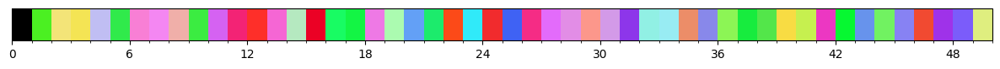

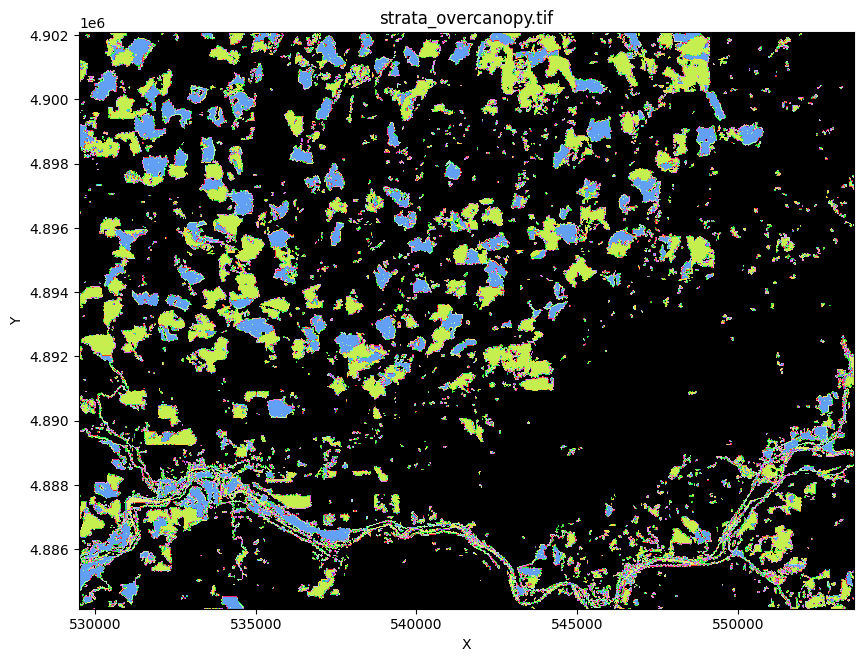

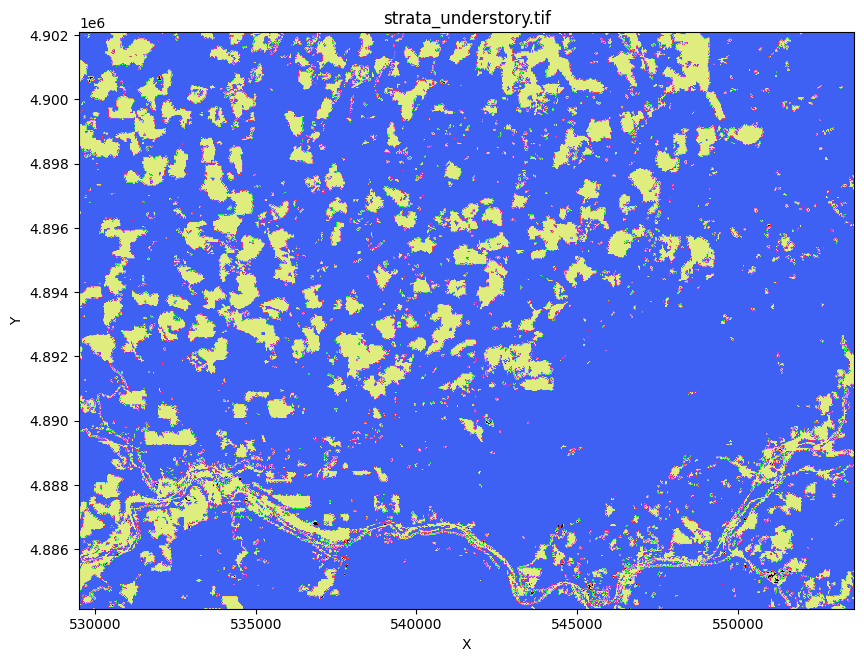

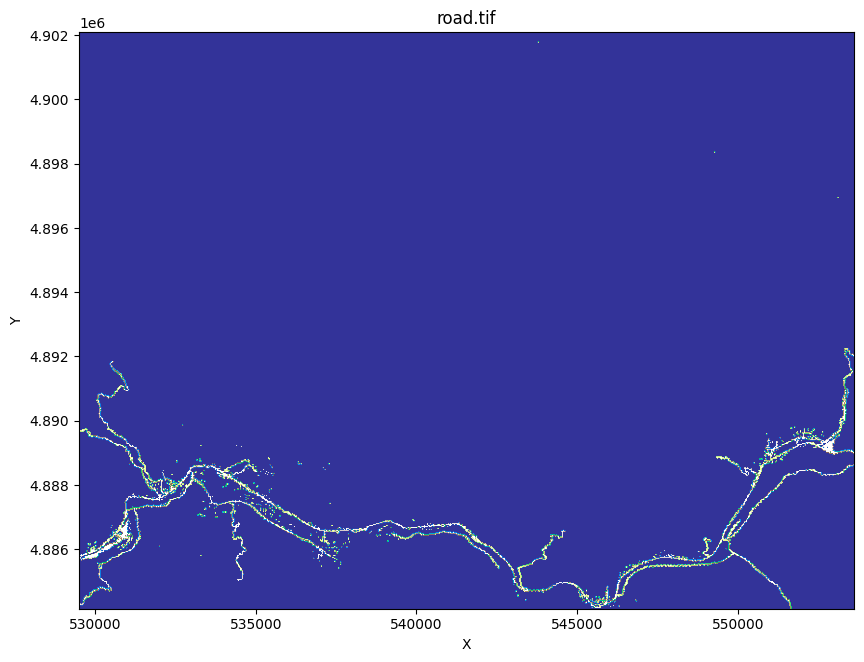

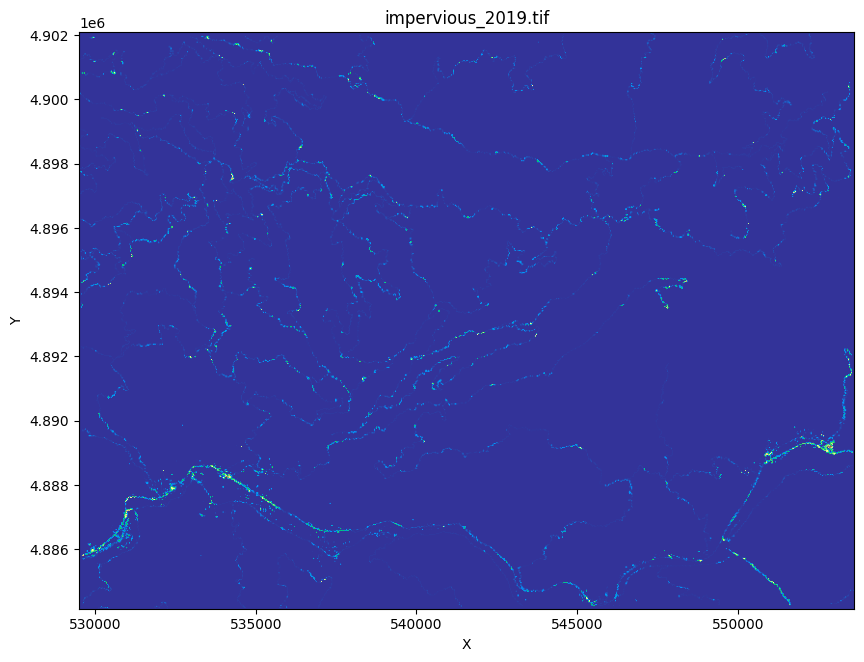

In [ ]:
new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
plot_geotiff(strata_overcanopy,new_cmap)
plot_geotiff(strata_understory,new_cmap)
plot_geotiff(road,'terrain',masked=False)
plot_geotiff(impervious,'terrain',masked=False)

##Calculate canopy cover

In [ ]:
canopy_cover = 'canopy_cover.tif'
landfire_evc = 'landfire_evc.tif'
wbt_landfire_evc = f'wbt_{landfire_evc}'
if not debug:
  #Download LANDFIRE EVC data
  #https://www.landfire.gov/metadata/lf2020/CONUS/LC22_EVC_220.html
  #projects/ee-mingliangliuearth/assets/LC22_EVC_220
  evc = ee.Image("projects/ee-mingliangliuearth/assets/LC22_EVC_220").select('b1').clip(geometry)
  download_url_evc = evc.getDownloadURL({
      'name': landfire_evc[:-4], # set a name for the downloaded file
      'scale': target_resolution, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
  })
  # Download the image to your local machine
  urllib.request.urlretrieve(download_url_evc, f'{geedata_dir}/{landfire_evc}')

  #need convert lai to uncompressed
  #no need tp do so if download from "projects/ee-mingliangliuearth/assets/LC22_EVC_220"
  #GeoTiffToUncompressedTiff(landfire_evc,wbt_landfire_evc)

  #reclassify to fractional data for RHESSys
  #wbt.conditional_evaluation(landfire_evc,'/tmp/tmpfevc.tif',)
  GeoTiffIntToFloat(landfire_evc,"/tmp/tmpfevc.tif")
  wbt.convert_nodata_to_zero("/tmp/tmpfevc.tif","/tmp/tmpfevc.tif")
  #wbt.raster_calculator('/tmp/tmpfevc_fraction.tif','"/tmp/tmpfevc.tif" / 100.0')
  #tree 110 - 195  shrub  210-279  herb 310 - 399
  #tree 
  wbt.raster_calculator('/tmp/tmpcc_tree.tif','("/tmp/tmpfevc.tif" - 100) / 100')
  wbt.conditional_evaluation('/tmp/tmpfevc.tif','/tmp/tmptree.tif','(value >= 110) && (value <= 195)',true='/tmp/tmpcc_tree.tif', false=0.05)
  #shrub
  wbt.raster_calculator('/tmp/tmpcc_shrub.tif','("/tmp/tmpfevc.tif" - 200) / 100')
  wbt.conditional_evaluation('/tmp/tmpfevc.tif','/tmp/tmpshrub.tif','(value >= 210) && (value <= 279)',true='/tmp/tmpcc_shrub.tif', false=0.05)
  #grasll
  wbt.raster_calculator('/tmp/tmpcc_grass.tif','("/tmp/tmpfevc.tif" - 300) / 100')
  wbt.conditional_evaluation('/tmp/tmpfevc.tif','/tmp/tmpgrass.tif',true='/tmp/tmpcc_grass.tif', false=0.05)

  #tree type
  wbt.conditional_evaluation(strata_overcanopy,'/tmp/tmptreecc.tif','(value >= 1) && (value <= 2)',true="/tmp/tmptree.tif", false=0.00)
  wbt.convert_nodata_to_zero('/tmp/tmptreecc.tif','/tmp/tmptreecc.tif')
  #shrub type
  wbt.conditional_evaluation(strata_overcanopy,'/tmp/tmpshrubcc.tif','value == 5',true="/tmp/tmpshrub.tif", false=0.00)
  wbt.convert_nodata_to_zero('/tmp/tmpshrubcc.tif','/tmp/tmpshrubcc.tif')
  #grass type
  wbt.conditional_evaluation(strata_overcanopy,'/tmp/tmpgrasscc.tif','(value >= 3) && (value <= 4)',true="/tmp/tmpgrass.tif", false=0.00)
  wbt.convert_nodata_to_zero('/tmp/tmpgrasscc.tif','/tmp/tmpgrasscc.tif')

  wbt.raster_calculator('/tmp/tmpcc.tif','"/tmp/tmptreecc.tif" + "/tmp/tmpshrubcc.tif" + "/tmp/tmpgrasscc.tif"')
  wbt.convert_nodata_to_zero('/tmp/tmpcc.tif',canopy_cover) 
  %rm /tmp/tmp*


Successfully converted landfire_evc.tif to /tmp/tmpfevc.tif
./whitebox_tools --run="ConvertNodataToZero" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --input='/tmp/tmpfevc.tif' --output='/tmp/tmpfevc.tif' -v --compress_rasters=False

**********************************
* Welcome to ConvertNodataToZero *
* Powered by WhiteboxTools       *
* www.whiteboxgeo.com            *
**********************************
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%
Progress: 37%
Progress: 38%
Progress: 39%
Progress: 40%
Progress: 4

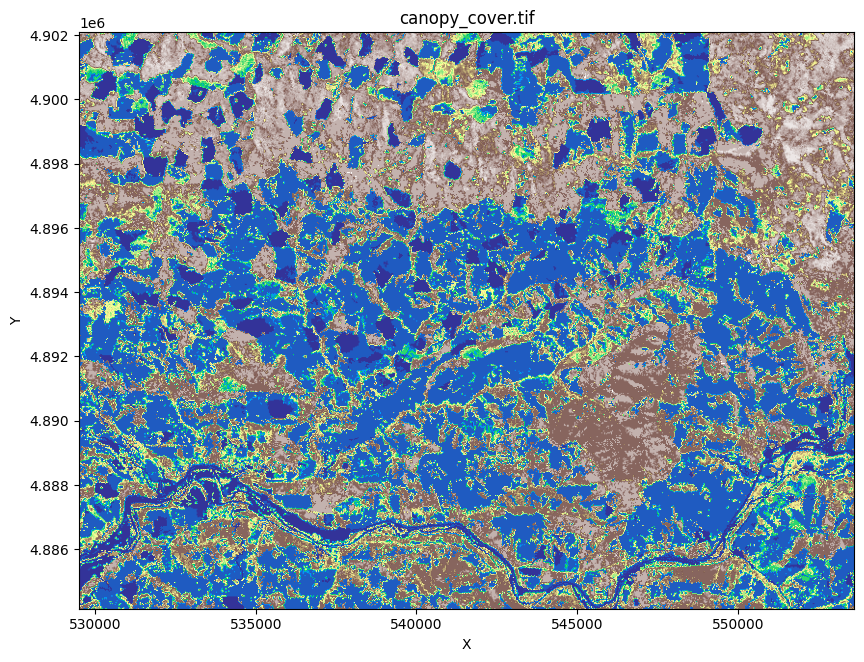

In [ ]:
plot_geotiff(canopy_cover,'terrain',masked=False)

## Calculate LAI from NDVI

In [ ]:
from scipy.stats import norm
import math
def EstimatePercentile(intiff,percentile):
  value = None
  wbt.equal_to(intiff,intiff,'/tmp/tmp1.tif')
  wbt.zonal_statistics(
      intiff, 
      '/tmp/tmp1.tif', 
      output=None, 
      stat="mean", 
      out_table='/tmp/tmpp.html'
  )
  
  tables = pd.read_html('/tmp/tmpp.html')
  %rm /tmp/tmp1.tif /tmp/tmpp.html

  #the first column is gridmet id, the second column is mean
  for index, row in tables[0].iterrows():
    # Do something with the row
    #print(f'{index} {row[0]} {row[1]} {row[2]}')
    if int(row[0]) == 0:
      avg = row[1]
      std = row[6]
      vmax = row[4]
      vmin = row[3]
      z_score = norm.ppf(percentile/100.0)
      # Calculate the value using the z-score
      value = avg + z_score * std
      if value > vmax:
        value = vmax
      elif value < vmin:
        value = vmin
  return value 

################################################################################
def EstimateLAIFromNDVI(ndvitiff,vegtypetiff,laitiff):
    #const predefined
    #1:evergreen 2:deciduous 3:grass 4:non veg 5:shrub 6:water 
    #11: water 31:rock 41: deciduous 42: pine 52: shrub 71: grass
    #beer's law
    lib_blaw = {1:0.46, 2:0.54, 3:0.48, 4:0.1, 5:0.55, 6:0.1}
    NDVIinf_const = {1:0.981, 2:0.878, 3:0.899, 4:0.524, 5:0.89705, 6:0.804}
    lib_maxlai = {1:12.21, 2:8.26, 3:4.09, 4:3.01, 5:5.24, 6:3.01}

    GeoTiffIntToFloat(vegtypetiff,'/tmp/tmpfveg.tif')
    
    wbt.conditional_evaluation(
        ndvitiff, 
        '/tmp/tmpndvi.tif', 
        statement=f"value >= 0", 
        true=ndvitiff, 
        false=0
    )
    time.sleep(2)
    #get NDVIinf for each veg type
    NDVIinf_cal = dict()
    
    #get the average NDVI of each type
    wbt.zonal_statistics(
      '/tmp/tmpndvi.tif', 
      vegtypetiff, 
      output=None, 
      stat="mean", 
      out_table='/tmp/tmpndvi.html'
    )
    #Generate dict to link table index to veg type
    veglist = GetUniqueValueList(vegtypetiff)
    print(f'veglist:{veglist}')
    table_id_to_vegid = GenerateListIndexDict(veglist)
    print(f'table_id_to_vegid:{table_id_to_vegid}')

    tables = pd.read_html('/tmp/tmpndvi.html')
    time.sleep(2)
    #%rm 'tmpndvi.html'
    #print(tables)
    #the first column is gridmet id, the second column is mean
    for index, row in tables[0].iterrows():
      # Do something with the row
      #print(f'{index} {row[0]} {row[1]} {row[2]}')
      if int(row[0]) >= 0:
        avg = row[1]
        std = row[6]
        max = row[4]
        z_score = norm.ppf(0.9)
        # Calculate the value using the z-score
        value = avg + z_score * std
        if value > max:
          value = max
        NDVIinf_cal[table_id_to_vegid[int(row[0])]] = value
      #wbt.raster_histogram('/tmp/tmpselndvi.tif','tmpselndvi.html') 

    #NEED CHECK IF THIS CONFINE IS REQUIRED!!
    #for veg in NDVIinf_const:
    #  if NDVIinf_cal[veg] > NDVIinf_const[veg]:
    #    NDVIinf_cal[veg] = NDVIinf_const[veg]
    print(f'NDVIinf_cal:{NDVIinf_cal}')

    #get NDVI back
    NDVIback = EstimatePercentile('/tmp/tmpndvi.tif',0.05)
    print(f'NDVIback:{NDVIback}')

    #Calculate LAI
    #range for log portion
    ln_min_lib = {}
    ln_max = 1.0
    for veg in lib_maxlai:
      ln_min_lib[veg] = math.exp(-lib_maxlai[veg]*lib_blaw[veg])
    
    #ln_coef = (NDVIinf - maxndvi_input)/(NDVIinf - NDVIback)
    rec_ndviinf = f'{NDVIinf_cal[1]};1;{NDVIinf_cal[2]};2;{NDVIinf_cal[3]};3;{NDVIinf_cal[4]};4;{NDVIinf_cal[5]};5;{NDVIinf_cal[6]};6'
    wbt.reclass('/tmp/tmpfveg.tif','/tmp/tmpndviinf.tif',rec_ndviinf,assign_mode=True)
    rec_ndviback = f'{NDVIback};1;7'
    wbt.reclass('/tmp/tmpfveg.tif','/tmp/tmpndviback.tif',rec_ndviback,assign_mode=False)
    time.sleep(5)
    #For using raster_calculator, need use the recompiled version
    %cp /content/drive/MyDrive/RHESSys/WhiteBoxTools_Colab_Compiled_Target_Release_20230324/raster_calculator /usr/local/lib/python3.9/dist-packages/whitebox/plugins/raster_calculator
    
    wbt.raster_calculator('/tmp/tmpln_coef.tif',f'("/tmp/tmpndviinf.tif" - "/tmp/tmpndvi.tif") / ("/tmp/tmpndviinf.tif" - "/tmp/tmpndviback.tif")')
    """
    wbt.subtract('/tmp/tmpndviinf.tif',ndvitiff, '/tmp/tmpsub1.tif')
    wbt.convert_nodata_to_zero('/tmp/tmpsub1.tif','/tmp/tmpsub1.tif')
    wbt.subtract('/tmp/tmpndviinf.tif','/tmp/tmpndviback.tif', '/tmp/tmpsub2.tif')
    wbt.convert_nodata_to_zero('/tmp/tmpsub2.tif','/tmp/tmpsub2.tif')
    wbt.divide('/tmp/tmpsub1.tif','/tmp/tmpsub2.tif','/tmp/tmpln_coef.tif')
    """
    wbt.convert_nodata_to_zero('/tmp/tmpln_coef.tif','/tmp/tmpln_coef.tif')


    #lai = (-1.0 / beerslaw) * Ln(Con(ln_coef > ln_max, ln_max, Con(ln_coef < ln_min, ln_min, ln_coef)))
    rec_ln_min = f'{ln_min_lib[1]};1;{ln_min_lib[2]};2;{ln_min_lib[3]};3;{ln_min_lib[4]};4;{ln_min_lib[5]};5;{ln_min_lib[6]};6'
    wbt.reclass('/tmp/tmpfveg.tif','/tmp/tmplnmin.tif',rec_ln_min,assign_mode=True)

    wbt.less_than('/tmp/tmpln_coef.tif','/tmp/tmplnmin.tif','/tmp/tmpcomp1.tif')
    wbt.convert_nodata_to_zero('/tmp/tmpcomp1.tif','/tmp/tmpcomp1.tif')
    wbt.conditional_evaluation('/tmp/tmpcomp1.tif','/tmp/tmpc2.tif',f'value == 1',true="/tmp/tmplnmin.tif",false='/tmp/tmpln_coef.tif')


    #wbt.greater_than('tmpln_coef.tif','tmplnmin.tif','tmpcomp1.tif')
    wbt.conditional_evaluation('/tmp/tmpln_coef.tif','/tmp/tmpc1.tif',f'value > {ln_max}',true=ln_max,false='/tmp/tmpc2.tif')


    wbt.ln('/tmp/tmpc1.tif','/tmp/tmpln.tif')
    wbt.convert_nodata_to_zero('/tmp/tmpln.tif','/tmp/tmpln.tif')
    

    rec_beers = f'{lib_blaw[1]};1;{lib_blaw[2]};2;{lib_blaw[3]};3;{lib_blaw[4]};4;{lib_blaw[5]};5;{lib_blaw[6]};6'
    wbt.reclass('/tmp/tmpfveg.tif','/tmp/tmpbeers.tif',rec_beers,assign_mode=True)

    #lai = (-1.0 / beerslaw) * Ln(Con(ln_coef > ln_max, ln_max, Con(ln_coef < ln_min, ln_min, ln_coef)))
    """
    wbt.reclass('/tmp/tmpfveg.tif','/tmp/tmpneg1.tif',f'-1;1;7',assign_mode=False)
    wbt.divide('/tmp/tmpneg1.tif','/tmp/tmpbeers.tif','/tmp/tmpeq1.tif')
    wbt.multiply('/tmp/tmpeq1.tif','/tmp/tmpln.tif','/tmp/tmplai.tif')
    """
    wbt.raster_calculator('/tmp/tmplai.tif'
        ,f'(-1.0 / "/tmp/tmpbeers.tif") * "/tmp/tmpln.tif"')
    wbt.convert_nodata_to_zero('/tmp/tmplai.tif','/tmp/tmplai.tif')

    #laiadj = Con(lai > maxlai, maxlai, Con(lai < 0.001, 0.001, lai))
    #maxlai
    rec_maxlai = f'{lib_maxlai[1]};1;{lib_maxlai[2]};2;{lib_maxlai[3]};3;{lib_maxlai[4]};4;{lib_maxlai[5]};5;{lib_maxlai[6]};6'
    wbt.reclass('/tmp/tmpfveg.tif','/tmp/tmpmaxlai.tif',rec_maxlai,assign_mode=True)
    

    wbt.conditional_evaluation('/tmp/tmplai.tif','/tmp/tmpa1.tif',f'value < 0.001',true=0.001,false='/tmp/tmplai.tif')
    wbt.greater_than('/tmp/tmplai.tif','/tmp/tmpmaxlai.tif','/tmp/tmpcomp2.tif')
    wbt.convert_nodata_to_zero('/tmp/tmpcomp2.tif','/tmp/tmpcomp2.tif')
    wbt.conditional_evaluation('/tmp/tmpcomp2.tif',laitiff,f'value == 1',true="/tmp/tmpmaxlai.tif",false='/tmp/tmpa1.tif')
    
    #%rm /tmp/tmp*.*



In [ ]:
ndvi = 'NDVI2020_L8.tif'
wbt_ndvi = 'wbt_' + ndvi
lai = 'lai_from_' + ndvi
if not debug:
  GeoTiffToUncompressedTiff(ndvi,wbt_ndvi)
  time.sleep(2)
  EstimateLAIFromNDVI(wbt_ndvi,strata_overcanopy,lai)

Successfully converted NDVI2020_L8.tif to wbt_NDVI2020_L8.tif
Successfully converted strata_overcanopy.tif to /tmp/tmpfveg.tif
./whitebox_tools --run="ConditionalEvaluation" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --input='wbt_NDVI2020_L8.tif' --statement=value >= 0 --true='wbt_NDVI2020_L8.tif' --false='0' --output='/tmp/tmpndvi.tif' -v --compress_rasters=False

************************************
* Welcome to ConditionalEvaluation *
* Powered by WhiteboxTools         *
* www.whiteboxgeo.com              *
************************************
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progr

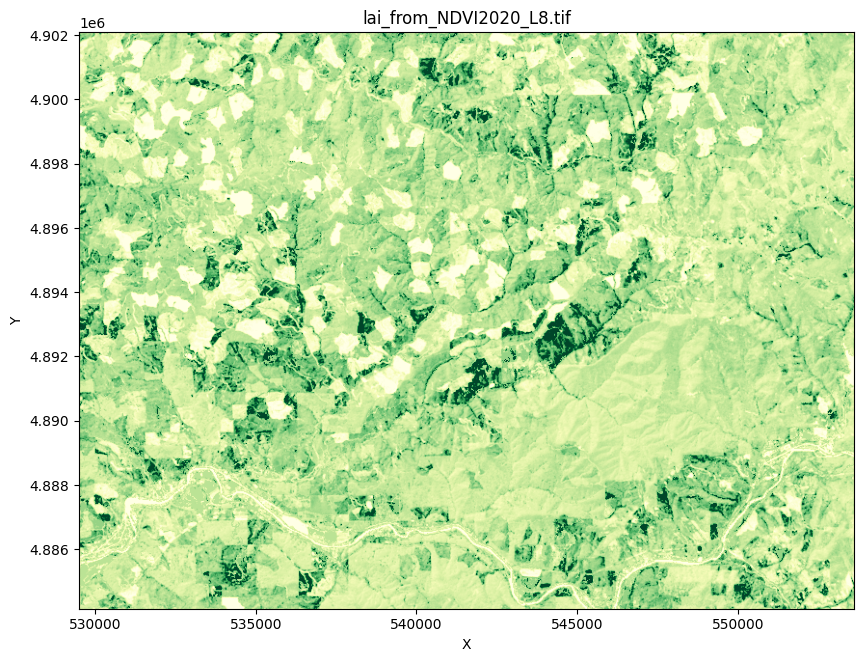

In [ ]:
plot_geotiff(lai,'YlGn',masked=False)

##Generate baseinfo text file from about dicts

In [ ]:
if not debug and download_gridmet:
    baseinfo = "baseinfo.base"
    
    #number to multiply to get the unit "m/day"
    ppt_coef = 86.4
    #number to multiply to get the unit to "fraction", i.e. in range 0-1
    rhum_coef = 0.01
    #temperature unit 'K' or 'C'
    temperature_unit = 'K'
    #huss should be in unit "kg/kg"
    #rsds should be in unit "W m-2"
    #wind should be in unit "m s-1"
    dist = 0.03
    screen_height = 10
    baseinfo_varname_to_ncname = {'tmax' : 'tmmx',
                                  'tmin' : 'tmmn',
                                  'rain' : 'pr',
                                  'huss' : 'sph',
                                  'rmax' : 'rmax',
                                  'rmin' : 'rmin',
                                  'rsds' : 'srad',
                                  'was' : 'vs'}


    print("Generating Baseinfo...")
    with open(baseinfo,'w') as f:
        f.write(str(len(gridmet_lai)) + ' grid_cells\n')
        f.write(str(dist) + ' location_searching_distance\n')
        f.write('1900 year_start_index\n')
        f.write('0.0 day_offset\n')
        f.write('1.0 leap_year_include\n')
        f.write(str(ppt_coef) + ' precip_multiplier\n')
        f.write(str(rhum_coef) + ' rhum_multiplier\n')
        f.write(temperature_unit + ' temperature_unit\n')
        f.write('lon netcdf_var_x\n')
        f.write('lat netcdf_var_y\n')
        for var in baseinfo_varname_to_ncname:
            f.write(f'NCPATH/{var}_{start_date[0:4]}_{end_date[0:4]}.nc netcdf_{var}_filename\n')
            f.write(f'{gridmet_vars[baseinfo_varname_to_ncname[var]]}  netcdf_var_{var}\n')
        for grid in gridmet_lai:
            f.write(str(grid) + ' base_station_id\n')
            #gridmet_id 0,lat 1,lon 2,utm_x 3,utm_y 4
            f.write(f'{station_cor_geo[grid][0]} lon\n')
            f.write(f'{station_cor_geo[grid][1]} lat\n')
            f.write(f'{station_cor_prj[grid][0]} xc\n')
            f.write(f'{station_cor_prj[grid][1]} yc\n')
            f.write(f'{gridmet_elev[grid]:.1f} z_coordinate\n')
            f.write(f'{gridmet_lai[grid]:.2f} effective_lai\n')
            f.write(str(screen_height) + ' screen_height\n')

# Generating soil texture and hydrological properties

##Functions and dictionary for converting soil texture defination and classification from gNATSGO to RHESSys

In [ ]:
#E. Benham and R.J. Ahrens, W.D. 2009. Clarification of Soil Texture Class Boundaries. Nettleton National Soil Survey Center, USDA-NRCS, Lincoln, Nebraska.
#A simple code to automate the determination of the soil textural class based on the percent of sand and clay according to the US Department of Agriculture Natural Resources Conservation Service (NRCS). There are a total of 12 soil textural classes and this classification is typically done by hand using the textural triangle
#https://soilwater.github.io/pynotes-agriscience/notebooks/soil_textural_class.html
def soiltexturalclass(sand,clay):
    """Function that returns the USDA 
    soil textural class given 
    the percent sand and clay.
    Inputs = Percetnage of sand and clay
    """
    silt = 100 - sand - clay
    if sand + clay > 100 or sand < 0 or clay < 0:
        raise Exception('Inputs adds over 100% or are negative')
    elif silt + 1.5*clay < 15:
        textural_class = 'sand'
    elif silt + 1.5*clay >= 15 and silt + 2*clay < 30:
        textural_class = 'loamy sand'
    elif (clay >= 7 and clay < 20 and sand > 52 and silt + 2*clay >= 30) or (clay < 7 and silt < 50 and silt + 2*clay >= 30):
        textural_class = 'sandy loam'
    elif clay >= 7 and clay < 27 and silt >= 28 and silt < 50 and sand <= 52:
        textural_class = 'loam'
    elif (silt >= 50 and clay >= 12 and clay < 27) or (silt >= 50 and silt < 80 and clay < 12):
        textural_class = 'silt loam'
    elif silt >= 80 and clay < 12:
        textural_class = 'silt'
    elif clay >= 20 and clay < 35 and silt < 28 and sand > 45:
        textural_class = 'sandy clay loam'
    elif clay >= 27 and clay < 40 and sand > 20 and sand <= 45:
        textural_class = 'clay loam'
    elif clay >= 27 and clay < 40 and sand <= 20:
        textural_class = 'silty clay loam'
    elif clay >= 35 and sand > 45:
        textural_class = 'sandy clay'
    elif clay >= 40 and silt >= 40:
        textural_class = 'silty clay'
    elif clay >= 40 and sand <= 45 and silt < 40:
        textural_class = 'clay'
    else:
        textural_class = 'na'
    return textural_class

#surface texture to USDS classes (add rock and water)
def soiltexture_name_to_USDA_classes(texture):
    """Function that returns the USDA 
    soil textural class given the name
    Inputs = texture name from gNATSGO
    """
    if 'water' in texture.lower():
        textural_class = 'water'
    elif 'bedrock' in texture.lower():
        textural_class = 'rock'
    elif 'sandy clay loam' in texture.lower():
        textural_class = 'sandy clay loam'
    elif 'silty clay loam' in texture.lower():    
        textural_class = 'silty clay loam'
    elif 'loamy sand' in texture.lower():     
        textural_class = 'loamy sand'
    elif 'sandy loam' in texture.lower():      
        textural_class = 'sandy loam'
    elif 'silt loam' in texture.lower():    
        textural_class = 'silt loam'
    elif 'clay loam' in texture.lower():    
        textural_class = 'clay loam'
    elif 'sandy clay' in texture.lower():      
        textural_class = 'sandy clay'
    elif 'silty clay' in texture.lower():    
        textural_class = 'silty clay'
    elif 'clay' in texture.lower():  
        textural_class = 'clay'
    elif 'loam' in texture.lower(): 
        textural_class = 'loam'  
    elif 'silt' in texture.lower(): 
        textural_class = 'silt'
    elif 'sand' in texture.lower():     
        textural_class = 'sand'
    else:
        textural_class = 'na'
    return textural_class
    
#coding according to RHESSys    
usda_to_rhessys_code = {'sand':10,
                        'loamy sand':11,
                        'sandy loam':12,
                        'loam':9,
                        'silt loam':8,
                        'silt':7,
                        'sandy clay loam':5,
                        'clay loam':6,
                        'silty clay loam':3,
                        'sandy clay':4,
                        'silty clay':2,
                        'clay':1,
                        'rock':13,
                        'water':14}

#GEE assest (surface properties (0~30 cm) from gNATSGO)
#csv tables
gNATSGO_Tables = {
  'surface_texture' : ["projects/ee-mingliangliuearth/assets/liu_surface_texture","SURFTEXT_DCD"],
  'clay' : ["projects/ee-mingliangliuearth/assets/clay_percent_dcp_0_30cm","CLAY_DCP"],
  'sand' : ["projects/ee-mingliangliuearth/assets/sand_percent_dcp_0_30cm","SAND_DCP"],
  'silt' : ["projects/ee-mingliangliuearth/assets/silt_percent_dcp_0_30cm","SILT_DCP"],
  'Ksat' : ["projects/ee-mingliangliuearth/assets/Ksat_dcp_0_30cm","KSAT_DCP"],
  'Bulkdensity' : ["projects/ee-mingliangliuearth/assets/Bulkdensity_dcp_0_30cm","DB3RDBAR_DCP"]
}
#GeoTiff 30 meter resolution mukey (32bit unsigned integer)
gNATSGO_mukey = "projects/ee-mingliangliuearth/assets/gNATSGO-mukey"

##Read and clip gNATSGO raster data and link the table

###Function to read GEE csv table to pandas dataframe

In [ ]:
import time
import pandas as pd
def ReadGeeCSVToDataFrame(gee_asset,name,overwrite):
  fc = ee.FeatureCollection(gee_asset) 
  # Export the FeatureCollection to Google Drive as a CSV file
  # Export the FeatureCollection to Google Drive
  download_url = fc.getDownloadURL(filetype='csv')
  # Download the image to your local machine
  if not os.path.exists(f'{geedata_dir}/{name}') or overwrite:
      urllib.request.urlretrieve(download_url, f'{geedata_dir}/{name}')
      time.sleep(10)
  df = pd.read_csv(f'{geedata_dir}/{name}')
  return df

###Download MUKEY 30 meter map

In [ ]:
soilmukey = 'soilmukey.tif'
fsoilmukey = 'fsoilmukey.tif'
download_soilproperty = False
#wbt use uncompressed GeoTiff
wbt_soilmukey = 'wbt_' + soilmukey
fwbt_soilmukey = 'fwbt_' + soilmukey
wbt_soilmukey_fc = f'wbt_{soilmukey[:-4]}.shp'
mukeylist = list()
if not debug and download_soilproperty:
  mukeymap = ee.Image(gNATSGO_mukey).clip(geometry)
  download_url_dem = mukeymap.getDownloadURL({
      'name': soilmukey[:-4], # set a name for the downloaded file
      'scale': target_resolution, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
  })
  # Download the image to your local machine
  urllib.request.urlretrieve(download_url_dem, f'{geedata_dir}/{soilmukey}')

  GeoTiffToUncompressedTiff(soilmukey,wbt_soilmukey)
  #get mukey list for selecting subset the property table
  mukeylist = GetUniqueValueList(wbt_soilmukey)

  #generate polygon (for linking the soil property)
  wbt.raster_to_vector_polygons(wbt_soilmukey,wbt_soilmukey_fc)

###Download soil property table (csv)

In [ ]:
#read info tabe ntodictionery
import pandas as pd
if not debug and download_soilproperty:
  allsoil_property = dict()
  print(f'mukeylist({len(mukeylist)}):{mukeylist}')
  for soildata in gNATSGO_Tables:
    allsoil_property[soildata] = dict()
    varname = gNATSGO_Tables[soildata][1]
    print(f'{soildata}:{varname}')
    rawdf = ReadGeeCSVToDataFrame(gNATSGO_Tables[soildata][0],f'{varname}.csv',False)
    seldf = rawdf[['MUKEY',varname]]
    subset = seldf[seldf['MUKEY'].isin(mukeylist)]
    print(subset.head())

    #read all records into the dictionery
    for index, row in subset.iterrows():
      #print(row['c1'], row['c2'])
      allsoil_property[soildata][int(row['MUKEY'])] = row[varname]
    print(allsoil_property[soildata])

###Reclass soil texture type based on percent of sand, silt, clay, and surface texture type and remap to RHESSys coding

In [ ]:
out_soil_type = dict()
#print(allsoil_property['surface_texture'])
if not debug and download_soilproperty:
  for mukey in mukeylist:
    outtype = 0
    #print(str(mukey))
    if mukey in allsoil_property['surface_texture'] \
      and mukey in allsoil_property['clay'] \
      and mukey in allsoil_property['sand']:
      usda_class = 'na'
      if allsoil_property['surface_texture'][mukey] is not None and not pd.isna(allsoil_property['surface_texture'][mukey]):
        #print(allsoil_property['surface_texture'][mukey])
        usda_class = soiltexture_name_to_USDA_classes(allsoil_property['surface_texture'][mukey])
      else:
        usda_class = 'na'

      outtype = 0            
      if usda_class == "water":
        outtype = usda_to_rhessys_code["water"]
      elif usda_class == "rock":
        outtype = usda_to_rhessys_code["rock"]
      elif allsoil_property['clay'][mukey] is not None and allsoil_property['sand'][mukey] is not None: 
        name_from_texture = soiltexturalclass(allsoil_property['sand'][mukey],allsoil_property['clay'][mukey])
        if name_from_texture in usda_to_rhessys_code:
          outtype = usda_to_rhessys_code[name_from_texture]
        elif usda_class in usda_to_rhessys_code:
          outtype = usda_to_rhessys_code[usda_class]
      elif usda_class in usda_to_rhessys_code:
        outtype = usda_to_rhessys_code[usda_class]

    out_soil_type[mukey] = outtype

  print(f'out_soil_type:{out_soil_type}')

###Generating GeoTiff outputs of soil texture type and properties 

In [ ]:
if not debug and download_soilproperty:
  #for reclass float type
  GeoTiffIntToFloat(wbt_soilmukey,fwbt_soilmukey)
  #two option: fill none with neighbor, or fill with water type (i.e. 14)
  fill_none = True
  fill_textturetype_with_neighbor = True

  #generating remap class
  for var in gNATSGO_Tables:
    if var == 'surface_texture':
      tab = out_soil_type
      intiff = wbt_soilmukey
    else:
      tab = allsoil_property[var]
      intiff = fwbt_soilmukey
    
    remap = ""
    for mukey in mukeylist:
      if mukey in tab:
        if not pd.isna(tab[mukey]):
          remap += f';{tab[mukey]};{int(mukey)}'
        else:
          remap += f';0;{int(mukey)}'
      else:
        remap += f';0;{int(mukey)}'
    remap = remap[1:]

    print(f'{var}:{remap}')
    wbt.reclass(
      intiff, 
      f'{var}.tif', 
      remap, 
      assign_mode=True
    )
    
    if fill_none and var == 'surface_texture':
      wbt.convert_nodata_to_zero(f'{var}.tif',f'{var}.tif')
      outfill = 'fillna_' + f'{var}.tif'
      if fill_textturetype_with_neighbor:
        Nibble(f'{var}.tif',outfill)
      else:
        wbt.conditional_evaluation(f'{var}.tif',outfill,'value == 0', true=14,false='{var}.tif')


Number of labels: 50


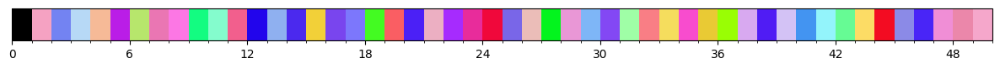

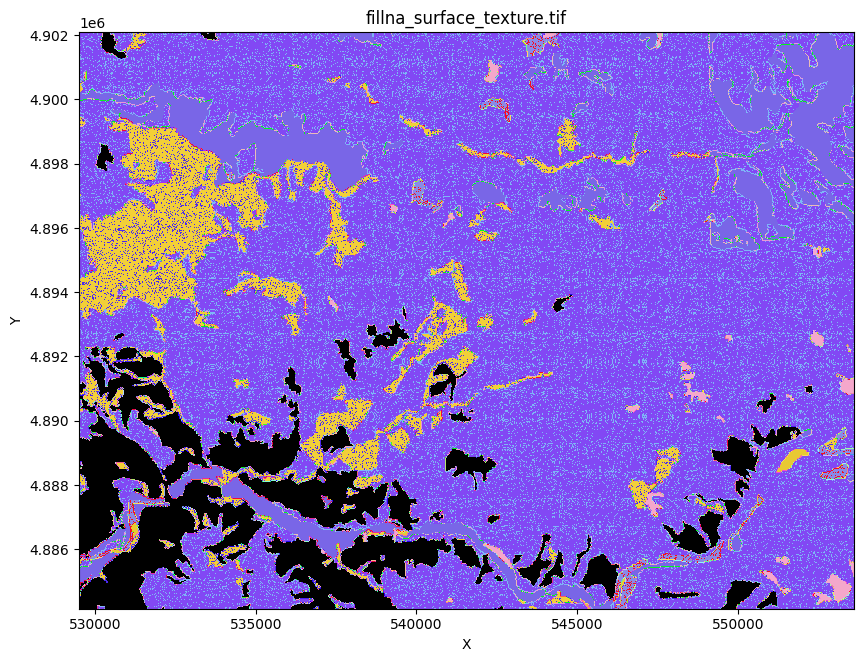

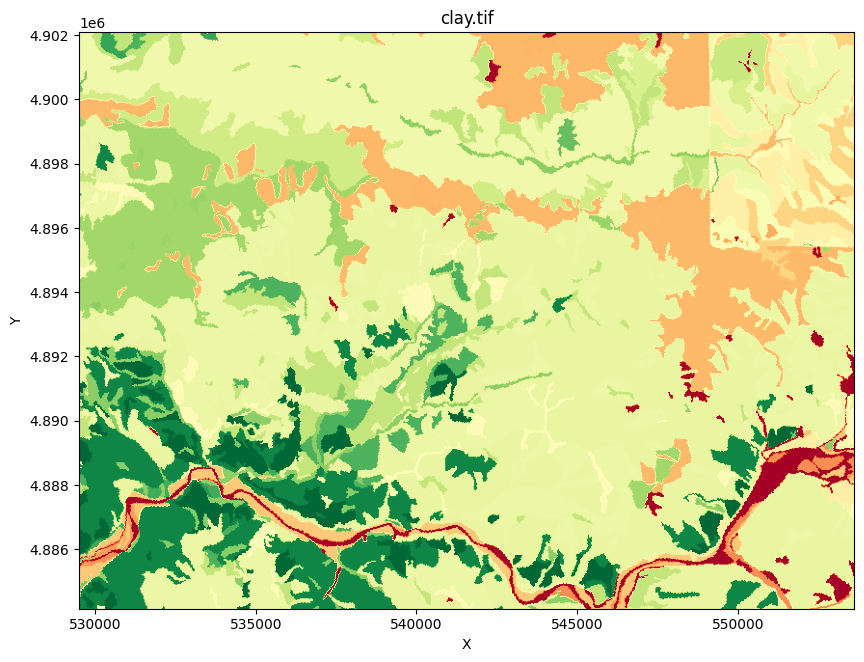

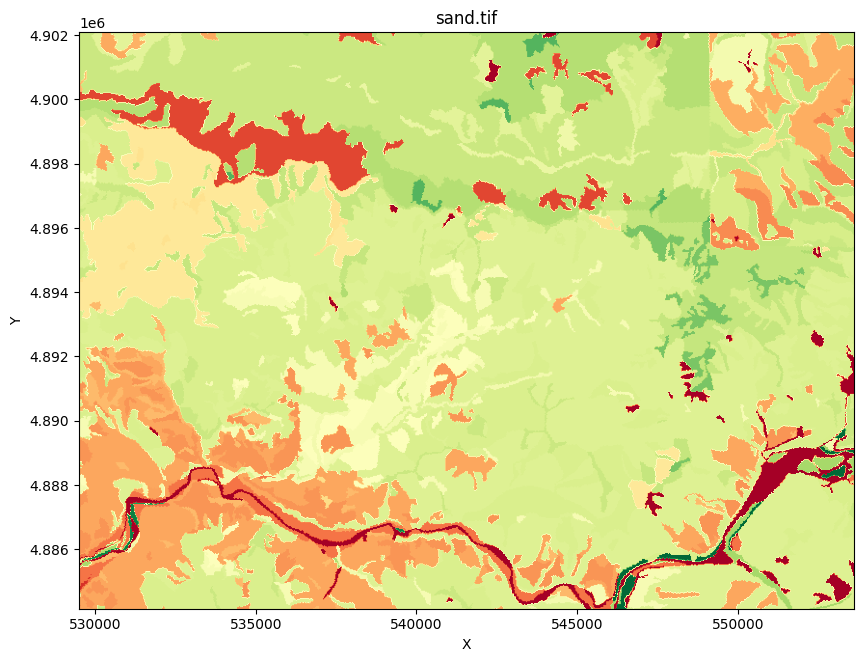

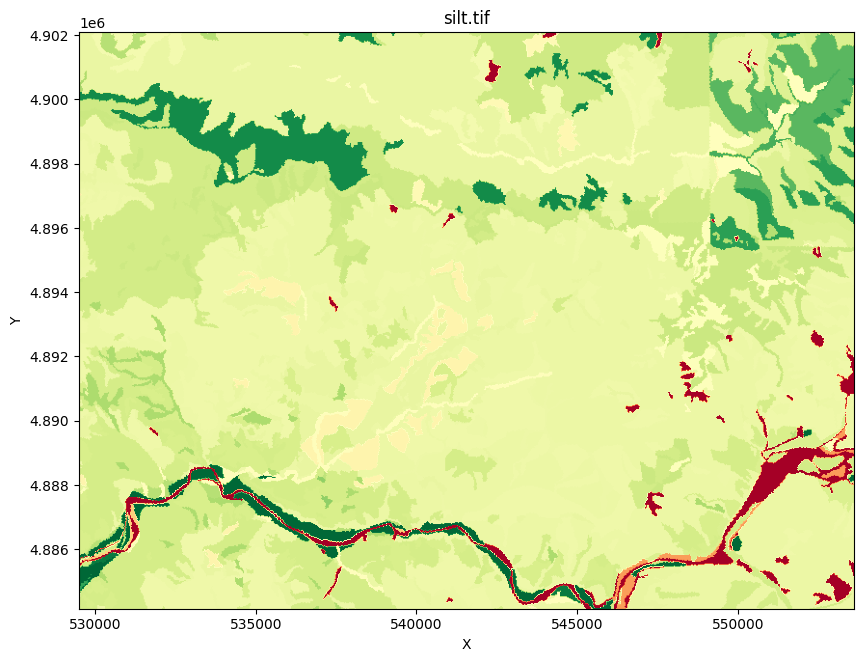

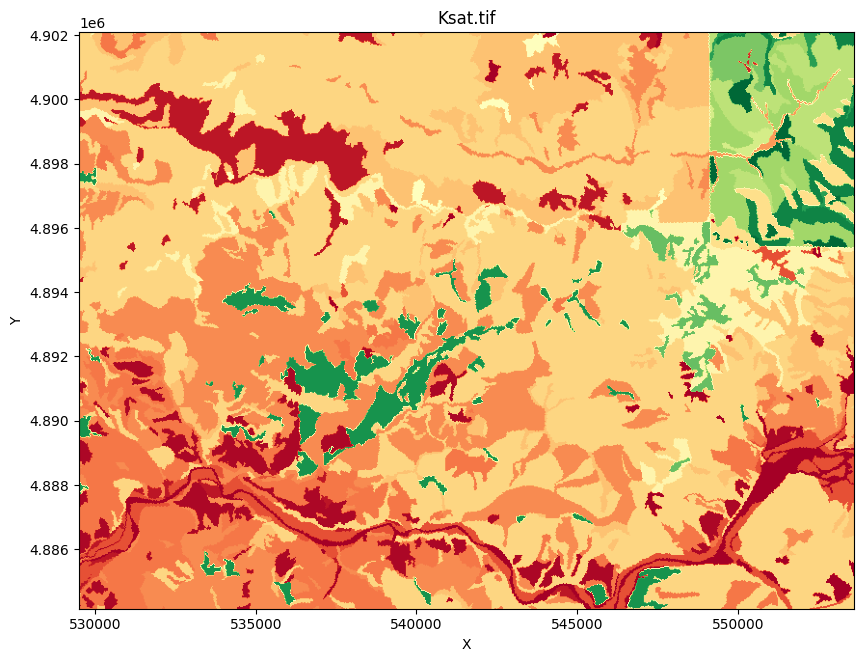

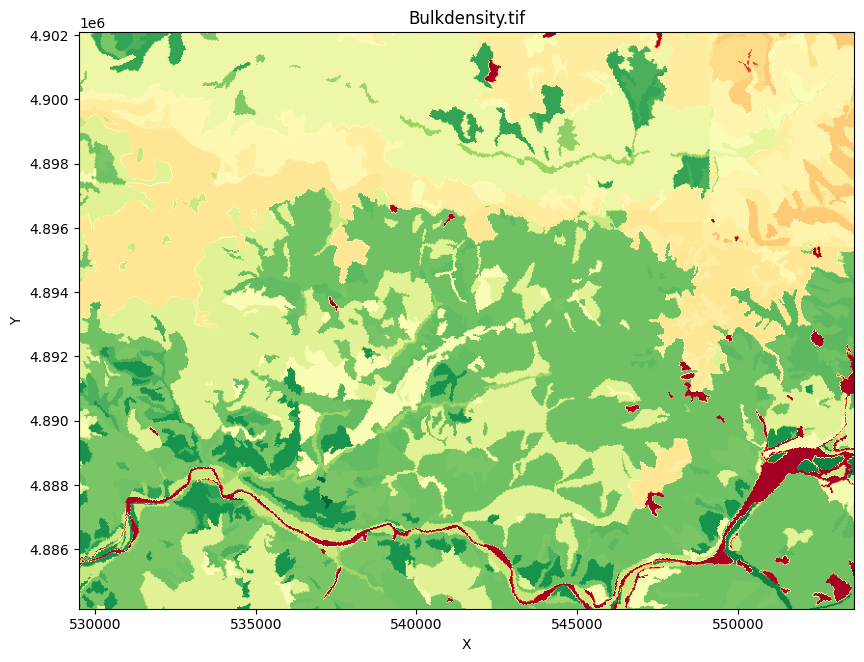

In [ ]:
new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
plot_geotiff('fillna_surface_texture.tif',new_cmap,masked=False)
for var in gNATSGO_Tables:
  if var != 'surface_texture':
    plot_geotiff(f'{var}.tif','RdYlGn',masked=False)

##Generate coordination raster


In [ ]:
if not debug:
  xcor = 'xcor.tif'
  ycor = 'ycor.tif'
  base = wbt_basin
  fbase = f'f_{wbt_basin}'
  GeoTiffIntToFloat(base,fbase)
  wbt.convert_nodata_to_zero(fbase,fbase)
  wbt.raster_cell_assignment(fbase,xcor,assign="X") 
  wbt.raster_cell_assignment(fbase,ycor,assign="Y") 

Successfully converted wbt_basin.tif to f_wbt_basin.tif
./whitebox_tools --run="ConvertNodataToZero" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --input='f_wbt_basin.tif' --output='f_wbt_basin.tif' -v --compress_rasters=False

**********************************
* Welcome to ConvertNodataToZero *
* Powered by WhiteboxTools       *
* www.whiteboxgeo.com            *
**********************************
Progress: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%
Progress: 37%
Progress: 38%
Progress: 39%
Progress: 40%
Progress: 41%
Pro

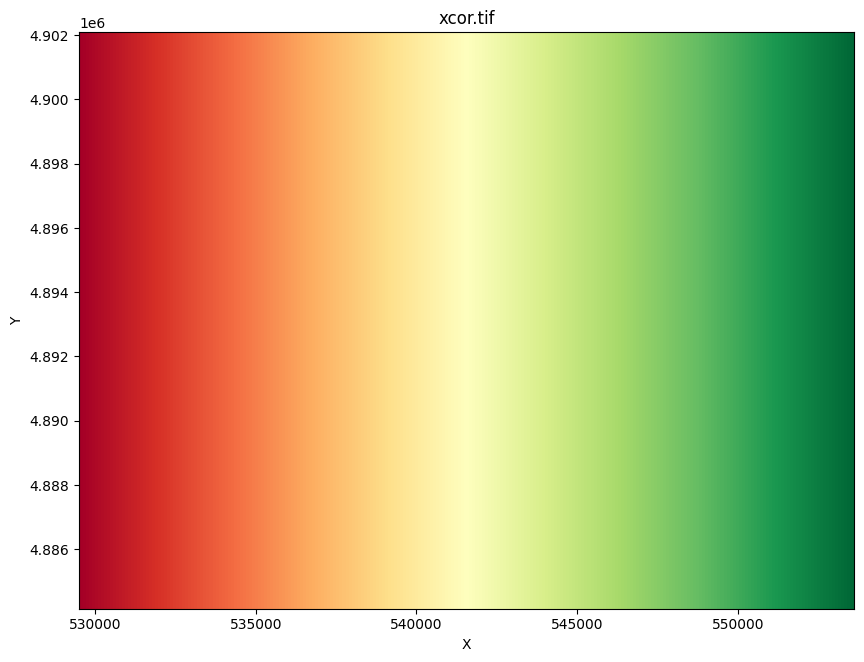

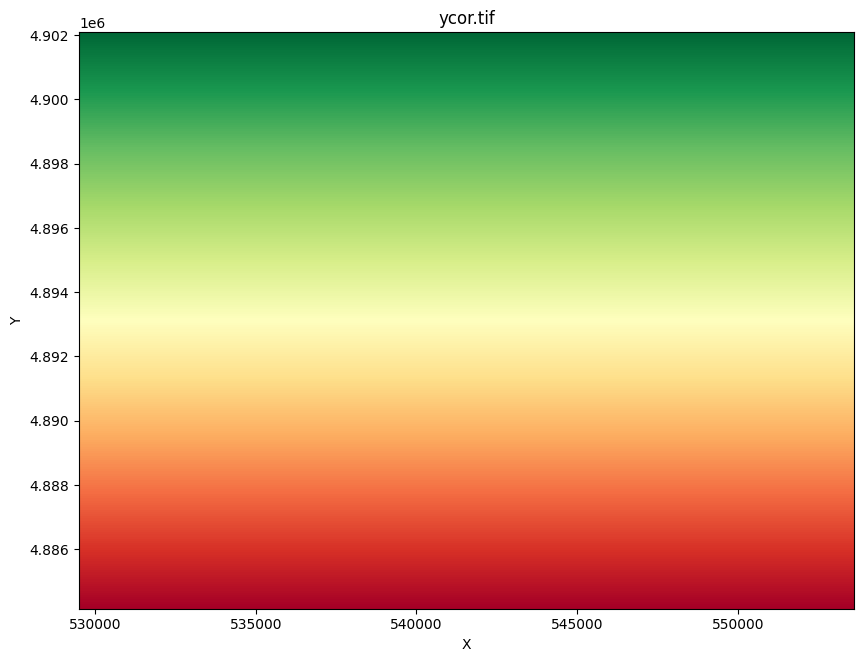

In [ ]:
plot_geotiff(xcor,'RdYlGn',masked=False)
plot_geotiff(ycor,'RdYlGn',masked=False)

##Generate patch structure, which need users to decide which factors needs to be included. 


In [ ]:
#download landform
downloadlandform = False
landform = 'landform.tif'
wbt_landform = f'wbt_{landform}'
if not debug and downloadlandform:
  lf = ee.Image('CSP/ERGo/1_0/US/landforms') \
    .select('constant') \
    .clip(geometry)
  download_url = lf.getDownloadURL({
      'name': landform[:-4], # set a name for the downloaded file
      'scale': target_resolution, # set the resolution of the downloaded image in meters
      'crs' : userprojection.crs().getInfo(),
      'format': 'GeoTIFF', # set the output format to GeoTIFF
      'region': geometry # set the region of interest
  })
  # Download the image to your local machine
  urllib.request.urlretrieve(download_url, f'{geedata_dir}/{landform}')
  time.sleep(2)
  GeoTiffToUncompressedTiff(landform,wbt_landform)
  wbt.convert_nodata_to_zero(wbt_landform,wbt_landform)
  time.sleep(2)

###Combine rasters to generate unique unit

###Function to combine multiple rasters to generate a unite ID for each combination


In [ ]:
from osgeo import gdal

def CombineToUniqueID(inputs_tiffs,outIDtiff):
  wbt.new_raster_from_base(
      inputs_tiffs[0], 
      '/tmp/tmpcombin.tif', 
      value=1, 
      data_type="double"
  )

  basenum = 0
  for rast in inputs_tiffs:
    data = gdal.Open(rast)
    num_cols = data.RasterXSize
    num_rows = data.RasterYSize
    print(f'{rast} rows:{num_rows} cols: {num_cols}')

    values = GetUniqueValueList(rast)
    rec = ""
    for index,var in enumerate(values):
      rec += f'{index+1};{var};'
    rec = rec[:-1]
    wbt.reclass(rast,f'/tmp/tmprec_{rast[:-4]}.tif',rec,assign_mode=True)
    if basenum == 0:
      wbt.raster_calculator('/tmp/tmpcombin.tif',f'"/tmp/tmpcombin.tif" + "/tmp/tmprec_{rast[:-4]}.tif"')
    else:
      wbt.raster_calculator('/tmp/tmpcombin.tif',f'"/tmp/tmpcombin.tif" + ("/tmp/tmprec_{rast[:-4]}.tif" * {basenum})')
    
    newbasenum = len(values)
    if basenum == 0:
      basenum = newbasenum
    else:
      basenum *= newbasenum
    #print(f'newbasenum:{newbasenum} basenum:{basenum}')
  
  #remove small area of grid cells
  #EliminateAndFilleWithNeighbors('/tmp/tmpcombin.tif','/tmp/tmpcombinelim.tif',False,9)
  #clump to generate unique value for each patch
  #wbt.clump('/tmp/tmpcombin.tif',outIDtiff,diag=False,zero_back=False)
  %cp '/tmp/tmpcombin.tif' {outIDtiff}
  time.sleep(5)
  %rm /tmp/tmp*


###Generate patch
Here I give one option by using landforms, hillslope, land cover, soil texture, land use, gridmet, and LAI max (rounded)

In [ ]:
from osgeo import gdal

lai = 'lai_from_NDVI2020_L8.tif'

patch_combination = 'patch_combination.tif'
patchID = 'patchID.tif'
base = 'wbt_basin.tif'
wbt.raster_calculator('tmplai.tif',f'round("{lai}")')

inputs_tiff = ['tmplai.tif',wbt_landform,strata_overcanopy,'surface_texture.tif',landuse,'gridmet.tif',final_sel_cleaned_hillslopes]
CombineToUniqueID(inputs_tiff,patch_combination)

#remove small area of grid cells
EliminateAndFilleWithNeighbors(patch_combination,'/tmp/tmppatch.tif',False,9)
wbt.clump('/tmp/tmppatch.tif',patchID,diag=False,zero_back=False)

./whitebox_tools --run="RasterCalculator" --wd="/content/drive/MyDrive/RHESSys/SpatialData/Basin/test" --statement=round("lai_from_NDVI2020_L8.tif") --output='tmplai.tif' -v --compress_rasters=False

*******************************
* Welcome to RasterCalculator *
* Powered by WhiteboxTools    *
* www.whiteboxgeo.com         *
*******************************
Reading data...
Reading data: 0%
Progress: 1%
Progress: 2%
Progress: 3%
Progress: 4%
Progress: 5%
Progress: 6%
Progress: 7%
Progress: 8%
Progress: 9%
Progress: 10%
Progress: 11%
Progress: 12%
Progress: 13%
Progress: 14%
Progress: 15%
Progress: 16%
Progress: 17%
Progress: 18%
Progress: 19%
Progress: 20%
Progress: 21%
Progress: 22%
Progress: 23%
Progress: 24%
Progress: 25%
Progress: 26%
Progress: 27%
Progress: 28%
Progress: 29%
Progress: 30%
Progress: 31%
Progress: 32%
Progress: 33%
Progress: 34%
Progress: 35%
Progress: 36%
Progress: 37%
Progress: 38%
Progress: 39%
Progress: 40%
Progress: 41%
Progress: 42%
Progress: 43%
Progress: 44%


0

Number of labels: 50


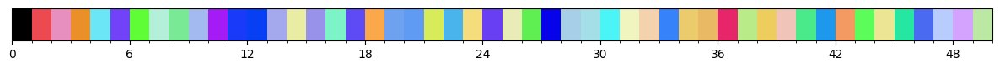

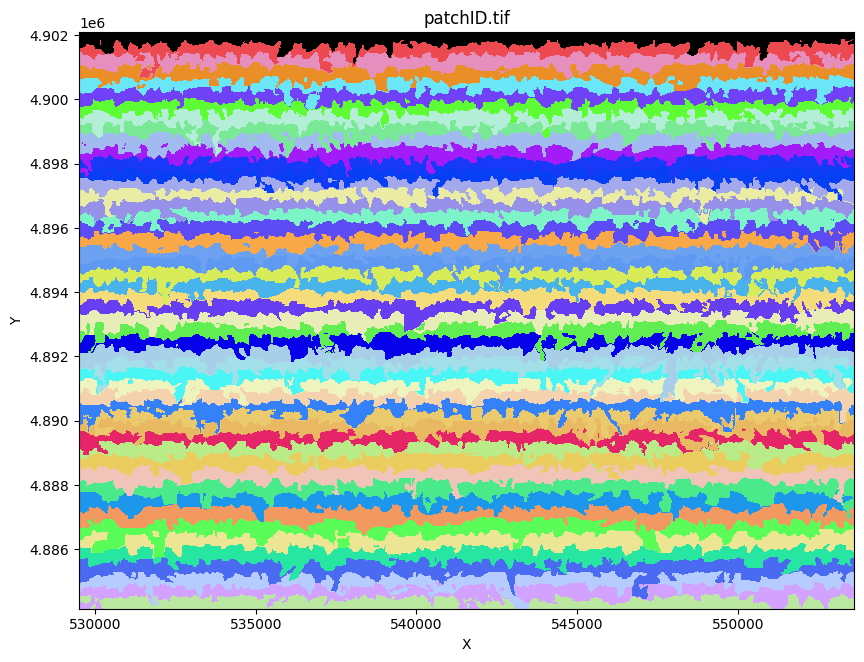

In [ ]:
new_cmap = rand_cmap(50, type='bright', first_color_black=True, last_color_black=False, verbose=True)
plot_geotiff(patchID,new_cmap,masked=False)